In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

import networkx as nx
import matplotlib.pyplot as plt
from matplotlib import cm
import sys
import numpy as np

basedir = '../'
sys.path.append(basedir)

from lda_for_fragments import Ms2Lda
import visualisation.networkx.community as community
import visualisation.networkx.lda_visualisation as vis_util
from visualisation.pylab.lda_for_fragments_viz import Ms2Lda_Viz

<h1>Community detection demo</h1>

Load some karate club graph.

Zachary's Karate Club
nodes = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33]


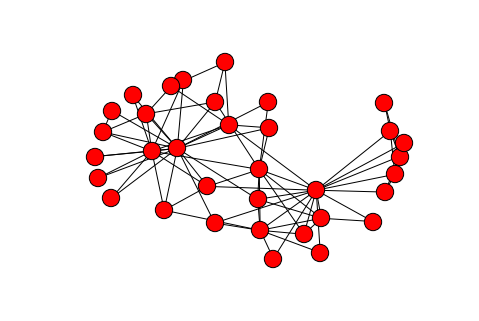

In [2]:
# load some data
G = nx.karate_club_graph()
print G
print "nodes = " + str(G.nodes())
nx.draw(G)

Partition the graph into several 'communities' based on modularity (https://en.wikipedia.org/wiki/Modularity_(networks)). 

Using the algorithm from Blondel, Vincent D., et al. "Fast unfolding of communities in large networks." Journal of Statistical Mechanics: Theory and Experiment 2008.10 (2008): P10008. http://arxiv.org/pdf/0803.0476.pdf

In [3]:
def find_community(G):
    print "Finding community"
    partition = community.best_partition(G)
    count = list(set([i for i in partition.values()]))
    print "Number of communities found = " + str(len(count))
    return partition

partition = find_community(G)
print "Partition = " + str(partition)

Finding community
Number of communities found = 4
Partition = {0: 0, 1: 0, 2: 0, 3: 0, 4: 1, 5: 1, 6: 1, 7: 0, 8: 2, 9: 0, 10: 1, 11: 0, 12: 0, 13: 0, 14: 2, 15: 2, 16: 1, 17: 0, 18: 2, 19: 0, 20: 2, 21: 0, 22: 2, 23: 3, 24: 3, 25: 3, 26: 2, 27: 3, 28: 3, 29: 2, 30: 2, 31: 3, 32: 2, 33: 2}


Visualise the communities

In [4]:
def plot_community(G, partition):
    size = float(len(set(partition.values())))
    count = 0.
    for com in set(partition.values()) :
        count = count + 1.
        list_nodes = [nodes for nodes in partition.keys()
                                    if partition[nodes] == com]
        print "Community " + str(com) + " = " + str(list_nodes)
        H = G.subgraph(list_nodes)
        pos = nx.spring_layout(H)
        nx.draw_networkx_nodes(H, pos, list_nodes, node_size = 200,
                                    node_color = str(count / size))
        nx.draw_networkx_edges(H, pos, alpha=0.5)
        plt.show()

Community 0 = [0, 1, 2, 3, 7, 9, 11, 12, 13, 17, 19, 21]


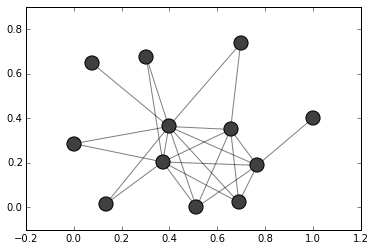

Community 1 = [4, 5, 6, 10, 16]


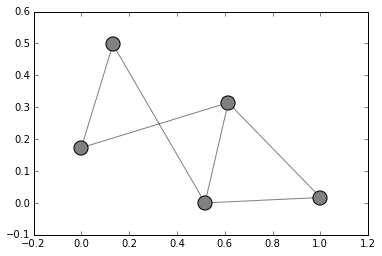

Community 2 = [8, 14, 15, 18, 20, 22, 26, 29, 30, 32, 33]


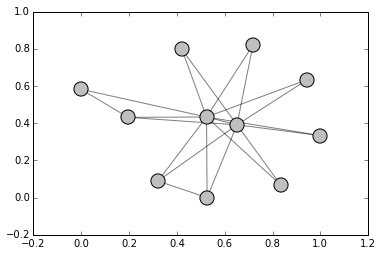

Community 3 = [23, 24, 25, 27, 28, 31]


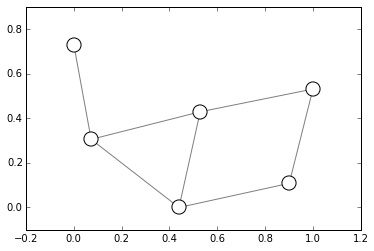

In [5]:
plot_community(G, partition)

<h1>Beer3pos Data</h1>

Now we do a similar analysis but with our topics data. Basically we want to check to see if there are terms that these topics share in common. If these exist and they make some biological sense, we can learn this through some form of hierarchical modelling. Otherwise, it's no go.

First, we load our beer3pos LDA results and do some thresholding as usual.

In [6]:
ms2lda = Ms2Lda.resume_from('results/beer3pos.project')

Project loaded from results/beer3pos.project time taken = 25.2290658951
 - input_filenames = 
	../input/manuscript/Beer3pos_MS1filter_Method3_fragments.csv
	../input/manuscript/Beer3pos_MS1filter_Method3_losses.csv
	../input/manuscript/Beer3pos_MS1filter_Method3_ms1.csv
	../input/manuscript/Beer3pos_MS1filter_Method3_ms2.csv
 - df.shape = (1422, 4496)
 - K = 300
 - alpha = 0.166666666667
 - beta = 0.1
 - number of samples stored = 1
 - last_saved_timestamp = Fri Oct 16 02:56:11 2015
 - message = Beer3Pos analysis for the manuscript with SIRIUS EF Annotation


In [7]:
ms2lda.do_thresholding(th_doc_topic=0.05, th_topic_word=0.01)

Then we create a network graph of topics relationship. Nodes in the graph are topics and the terms. An edge is drawn from topic to term if the term is 'present' in the thresholded topic distribution.

In [8]:
plotter = Ms2Lda_Viz(ms2lda.model, ms2lda.ms1, ms2lda.ms2, ms2lda.docdf, ms2lda.topicdf)

In [9]:
json, G = vis_util.get_json_from_topicdf(plotter.topicdf)

Total nodes = 4796
Total edges = 4148


So we end up with a messy graph here. Then we run community detection algorithm on the graph. The idea here is that hopefully, within each community, the set of terms (fragment/loss words) that topics share might represent some chemical meaning??

In [10]:
node_names = {}
for n in G.nodes():
    name = G.node[n]['name']
    node_names[n] = name
partition = find_community(G)

Finding community
Number of communities found = 2419


Define a plotting function ..

In [23]:
import matplotlib as mpl
def plot_community(G, partition, node_names, show_label=False):

    norm = mpl.colors.Normalize(vmin=0, vmax=1)
    cmap = cm.hot
    m = cm.ScalarMappable(norm=norm, cmap=cmap)
    
    # loop over all partitions
    for com in set(partition.values()) :

        list_nodes = [nodes for nodes in partition.keys()
                                    if partition[nodes] == com]
        if len(list_nodes) == 1:
            continue

        print "================================================================================================"
        print "Community " + str(com)
        print "================================================================================================"
        
        topic_nodes = []
        other_nodes = []       
        topic_names = []
        other_names = []
        topic_labels = {}
        other_labels = {}
        other_degrees = []
        selected_topics = []

        H = G.subgraph(list_nodes)
        for n in list_nodes:
            name = node_names[n]
            if 'm2m' in name.lower():
                topic_nodes.append(n)
                topic_names.append(name)
                topic_id = name.split('_')[1]
                selected_topics.append(int(topic_id))
                topic_labels[n] = name
            else:
                other_nodes.append(n)
                other_names.append(name)
                other_labels[n] = name
                node_degree = H.degree(n)
                other_degrees.append(node_degree)
                # print " - " + name + " degree " + str(node_degree)

        if len(topic_nodes) == 1:
            print "Nothing interesting"
            print
            continue
                
        ms2lda.print_motif_features(selected_motifs=selected_topics, with_probabilities=False)
        
        fig = plt.figure(1, figsize=(16, 4))
        ax = plt.subplot(111)
        width = 0.8
        for n in range(len(other_names)):
            d = other_degrees[n]/float(len(topic_nodes))
            c = m.to_rgba(d)
            plt.bar(n, d, width=width, color=c)
        ax.set_xticks(np.arange(len(other_names)) + (width*0.8))
        ax.set_xticklabels(other_names, rotation=90) 
        plt.ylim((0, 1))
        plt.title('Term degrees / no. of topics')
        plt.show()
        
        plt.figure(1, figsize=(12, 12))
        pos = nx.spring_layout(H, scale=2)
        nx.draw_networkx_nodes(H, pos, topic_nodes, node_size=500, node_color='blue', alpha=0.5)
        nx.draw_networkx_nodes(H, pos, other_nodes, node_size=500, cmap=plt.get_cmap('hot'), 
                               node_color=other_degrees, alpha=0.50)
        nx.draw_networkx_edges(H, pos, alpha=0.25)
        if show_label:
            nx.draw_networkx_labels(H, pos, font_size=14, font_weight="bold", font_color='black', labels=topic_labels)        
            nx.draw_networkx_labels(H, pos, font_size=10, font_weight="normal", font_color='black', labels=other_labels)
        plt.title('Network of shared terms across topics')
        plt.show()

For each community, the first plot show the ratio between the degrees of terms in that community to the number of topics. If this ratio is 1, then the term is used by all topics in the community. If partitioning is sensible, we'd expect to see more terms with ratio = 1 here.

The second plot shows the network relationship of topics, based on the terms.

Community 0
Mass2Motif 75: loss_95.05803, fragment_105.00077, fragment_73.0285, fragment_55.01824, fragment_103.02119, fragment_149.02722, fragment_71.08573, loss_53.04788, fragment_58.99523, fragment_85.10122, fragment_144.0659, loss_83.05841, fragment_77.00542, loss_123.05309, loss_125.06876, loss_119.05812, 

Mass2Motif 118: fragment_98.03152, loss_65.04759, loss_78.05076, fragment_145.06834, fragment_70.03679, fragment_163.08034, loss_93.04248, fragment_117.05474, loss_46.02468, fragment_128.04276, loss_35.03689, fragment_99.04454, loss_106.04574, loss_64.03528, 

Mass2Motif 188: fragment_73.0285, fragment_115.03913, fragment_240.13519, fragment_133.0498, fragment_57.03408, fragment_97.07643, fragment_178.09849, fragment_204.11373, loss_120.05329, fragment_55.02948, loss_64.05223, loss_167.07941, 

Mass2Motif 200: loss_66.03193, fragment_276.12189, fragment_324.14598, loss_17.99887, fragment_108.08051, fragment_207.0655, loss_134.05766, fragment_208.09795, loss_69.05694, fragment_3

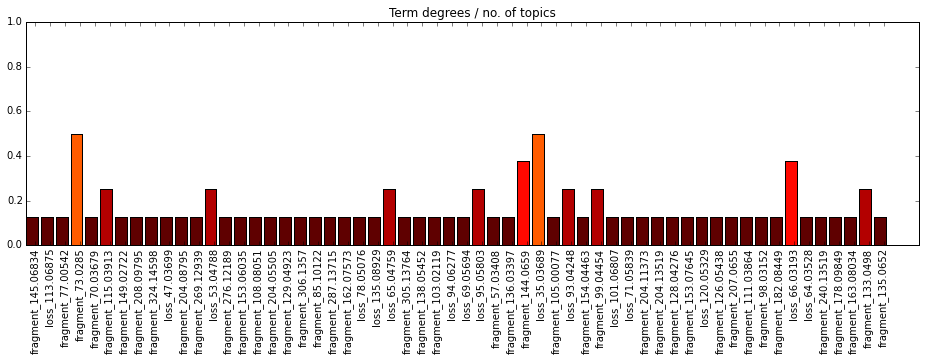

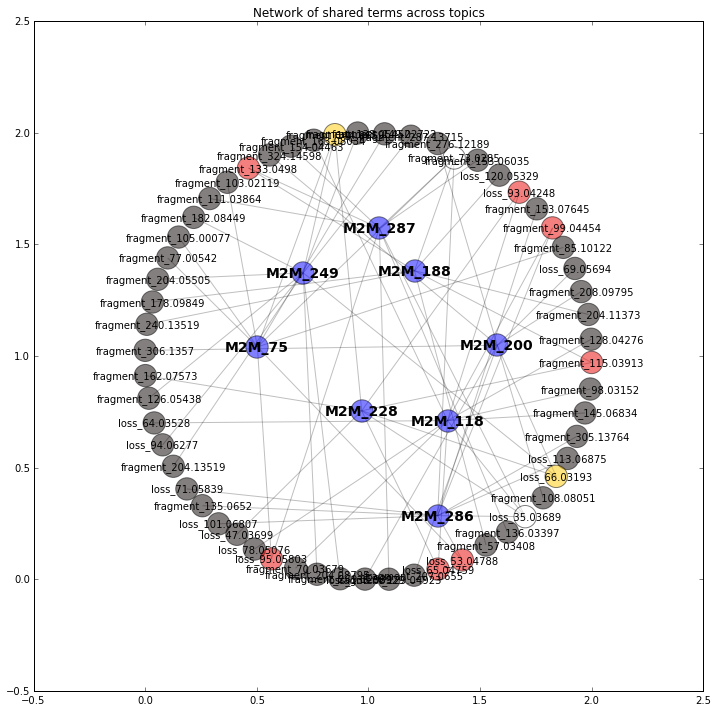

Community 1
Mass2Motif 216: fragment_140.06847, fragment_111.05547, fragment_82.05232, fragment_74.09665, loss_29.0028, fragment_114.08887, fragment_157.05994, 

Mass2Motif 240: loss_48.02104, loss_45.05767, loss_157.09461, fragment_242.10395, fragment_242.15781, loss_97.07382, loss_184.05838, fragment_58.06552, fragment_96.04502, loss_63.06803, loss_146.07951, loss_173.09006, fragment_57.03408, loss_145.09468, loss_185.09012, loss_169.09477, fragment_242.28215, loss_149.06869, loss_75.06851, fragment_126.05563, fragment_93.05447, 

Mass2Motif 261: loss_73.01611, fragment_111.0744, fragment_393.11719, fragment_84.06386, fragment_94.04825, fragment_111.06759, fragment_82.05232, fragment_157.08142, loss_100.02691, loss_61.01619, 

Mass2Motif 274: fragment_209.12974, loss_156.0894, fragment_210.13161, fragment_195.08875, loss_101.08393, fragment_125.07093, loss_157.09461, fragment_122.07158, fragment_226.15575, fragment_125.04694, fragment_82.05232, fragment_227.15895, fragment_167.09373,

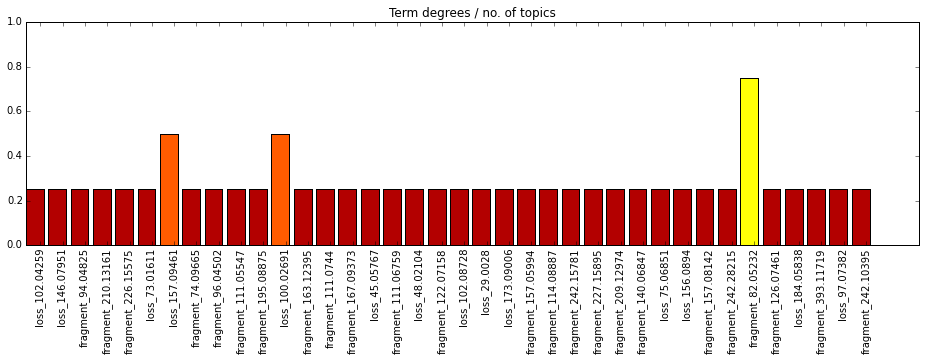

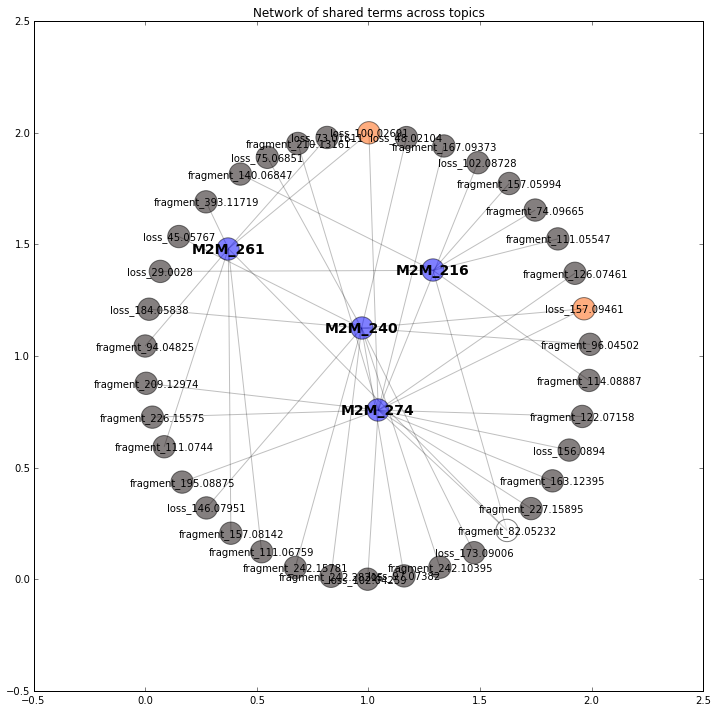

Community 4
Mass2Motif 12: loss_27.99401, fragment_65.03878, loss_55.98954, loss_54.00997, 

Mass2Motif 52: loss_55.98954, fragment_111.06314, fragment_139.05844, fragment_241.15318, loss_27.98357, loss_41.97401, loss_183.08923, loss_58.0416, loss_58.00534, fragment_82.04133, fragment_70.04014, fragment_53.00259, loss_42.01003, loss_157.07343, fragment_111.0565, loss_56.02612, fragment_95.06862, loss_29.0028, loss_43.98989, 



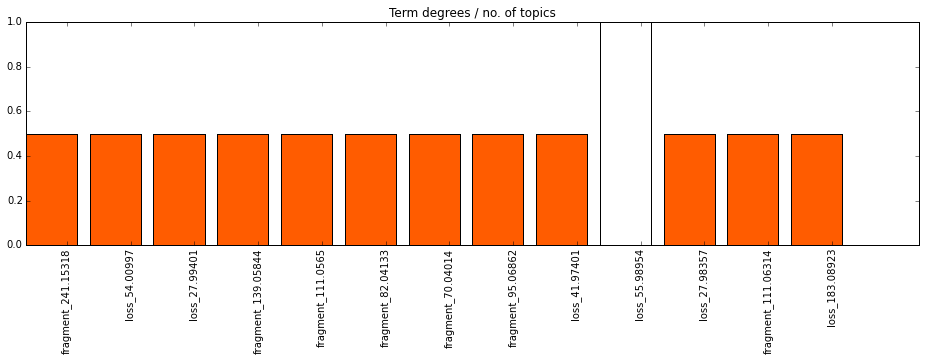

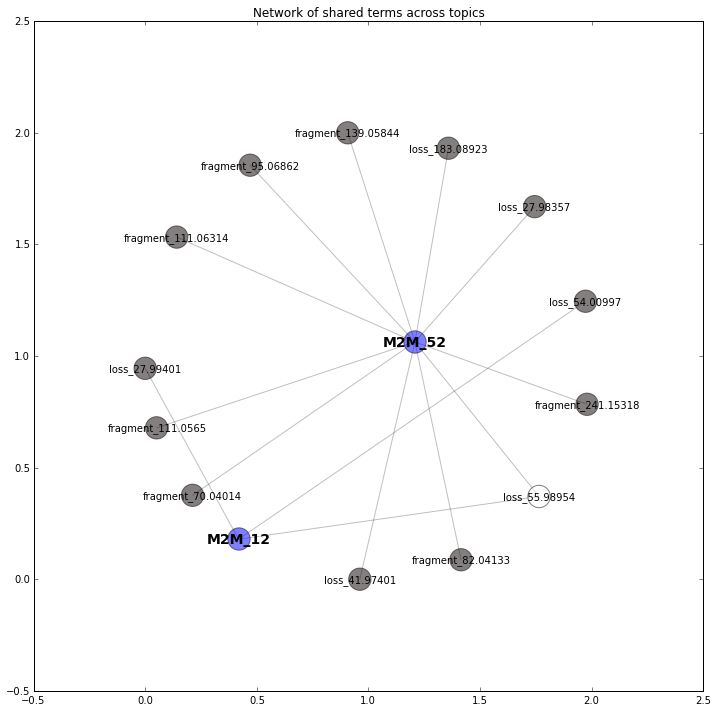

Community 6
Mass2Motif 25: fragment_107.06037, fragment_125.07093, fragment_314.0858, loss_106.06259, loss_74.07286, fragment_80.04949, fragment_296.07257, fragment_96.06827, fragment_125.10816, loss_108.07836, fragment_120.033, fragment_103.05448, fragment_97.07643, fragment_101.09635, loss_62.03678, fragment_131.04941, fragment_102.02242, fragment_162.89882, loss_26.01543, 

Mass2Motif 63: fragment_171.11261, fragment_72.04466, fragment_125.10759, fragment_96.06827, fragment_171.07651, fragment_150.09231, fragment_171.1487, fragment_125.10816, fragment_125.07093, fragment_55.05466, fragment_89.07121, fragment_143.11757, loss_188.11568, fragment_108.08051, fragment_175.10678, fragment_97.07643, fragment_359.1051, fragment_83.08555, loss_170.10463, 

Mass2Motif 168: fragment_181.09786, fragment_209.09231, fragment_125.07093, loss_193.07267, fragment_120.08156, loss_165.07878, fragment_226.12024, fragment_324.14598, 

Mass2Motif 186: loss_132.07864, loss_120.07847, loss_106.06259, loss_

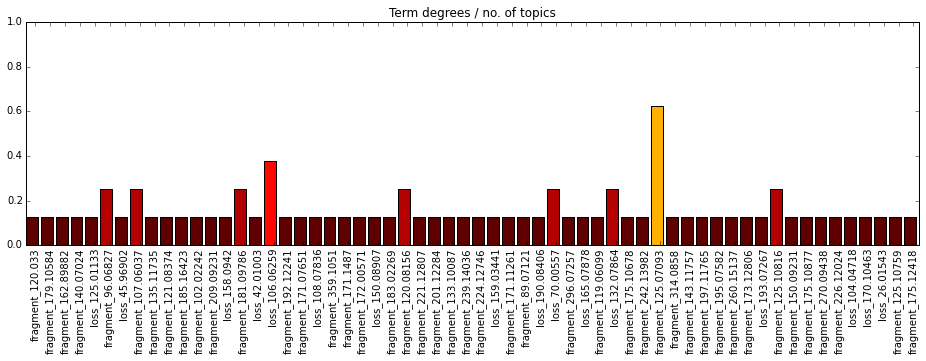

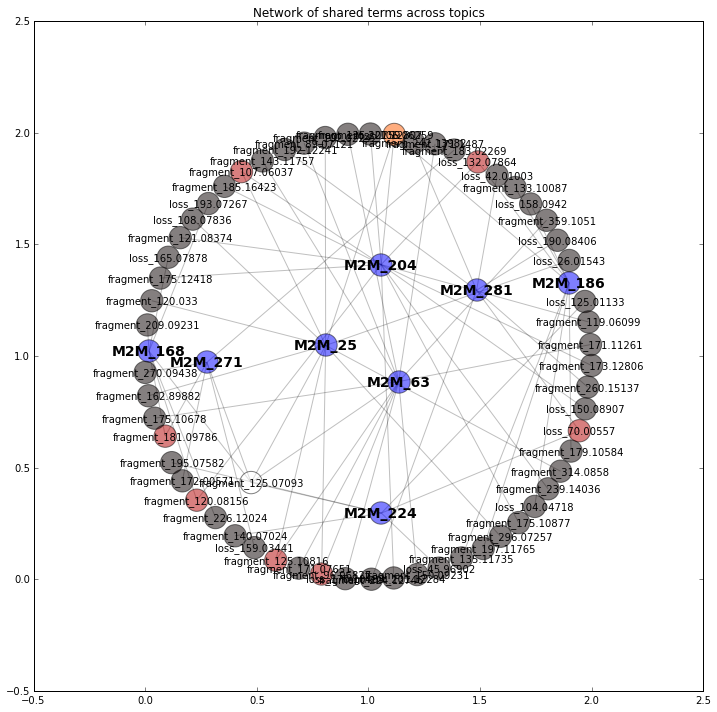

Community 7
Mass2Motif 30: loss_42.04695, loss_190.09499, loss_144.0897, loss_56.06255, loss_132.08964, loss_160.08466, loss_58.0416, loss_120.0897, fragment_142.05024, 

Mass2Motif 65: fragment_225.07565, fragment_331.19058, fragment_281.13705, fragment_79.05416, fragment_313.17946, fragment_275.1278, fragment_223.0968, fragment_207.0655, fragment_105.07019, fragment_261.14915, fragment_97.06466, fragment_257.11762, fragment_155.03355, fragment_115.05435, fragment_263.12555, fragment_95.04936, fragment_53.03888, fragment_133.06451, fragment_55.01824, fragment_91.05413, loss_88.05232, fragment_109.06454, 

Mass2Motif 106: fragment_209.08095, fragment_209.04378, loss_56.06255, fragment_83.013, loss_56.02612, fragment_265.14498, fragment_167.03436, fragment_163.03896, fragment_191.07095, fragment_115.05435, fragment_91.05413, loss_182.09381, fragment_53.03888, fragment_117.07032, fragment_149.0237, fragment_67.01807, fragment_79.05416, fragment_55.01824, fragment_199.02398, fragment_135.

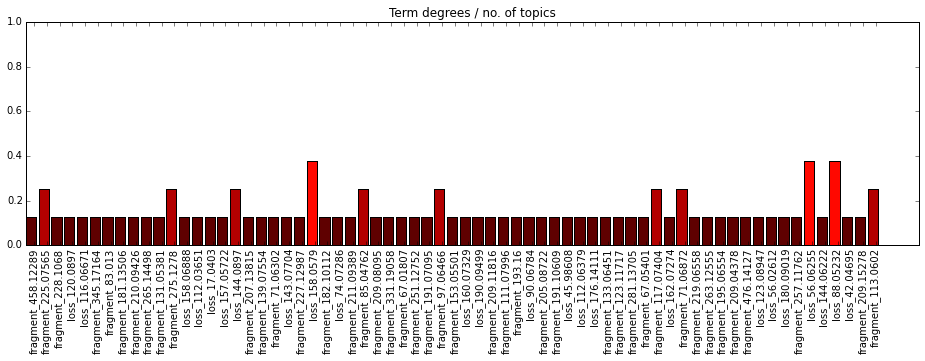

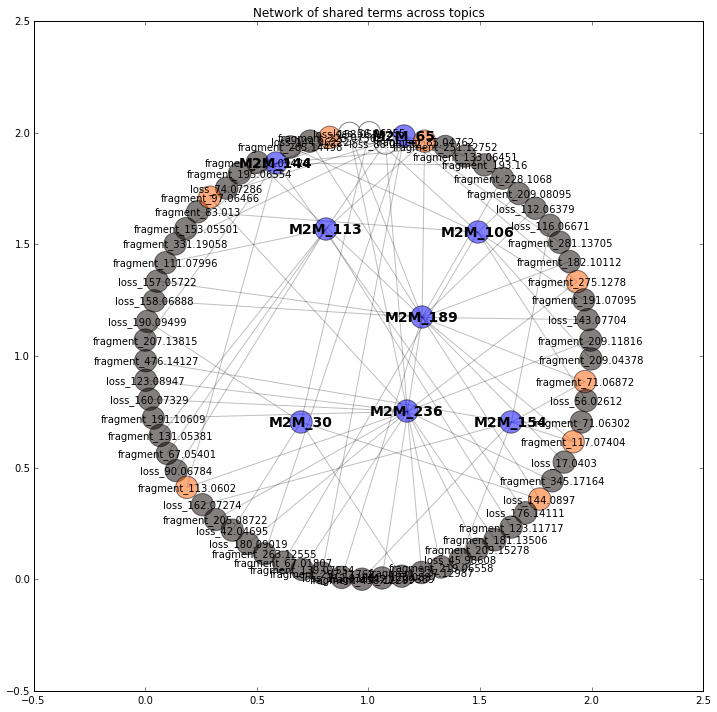

Community 8
Mass2Motif 79: fragment_118.08614, loss_117.07884, fragment_132.113, loss_130.12154, fragment_58.06552, fragment_59.07323, loss_177.09988, 

Mass2Motif 80: fragment_58.06552, fragment_116.07009, fragment_206.15288, loss_75.03184, loss_148.08497, fragment_206.65295, fragment_55.05466, loss_149.08142, fragment_101.09635, loss_151.09664, 

Mass2Motif 117: fragment_190.10765, loss_150.05243, fragment_58.06552, loss_130.02982, fragment_172.09769, fragment_352.16144, fragment_88.07588, loss_122.05736, fragment_208.11837, loss_120.04228, 

Mass2Motif 184: fragment_58.06552, fragment_119.08937, fragment_59.07323, fragment_120.09034, fragment_59.06877, fragment_173.04168, fragment_60.07657, loss_59.01322, fragment_76.07561, 



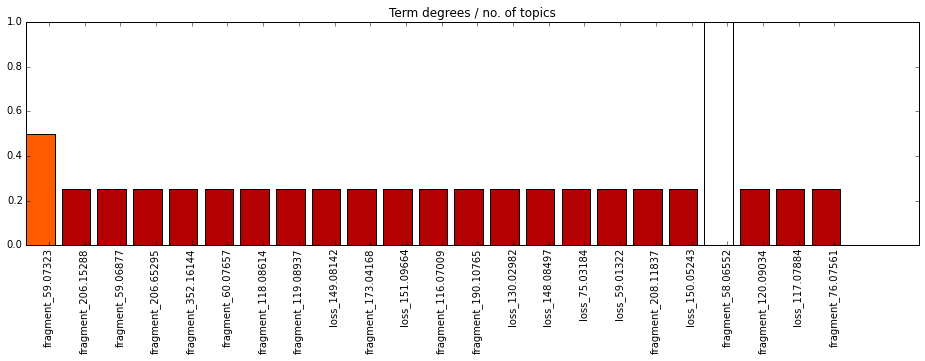

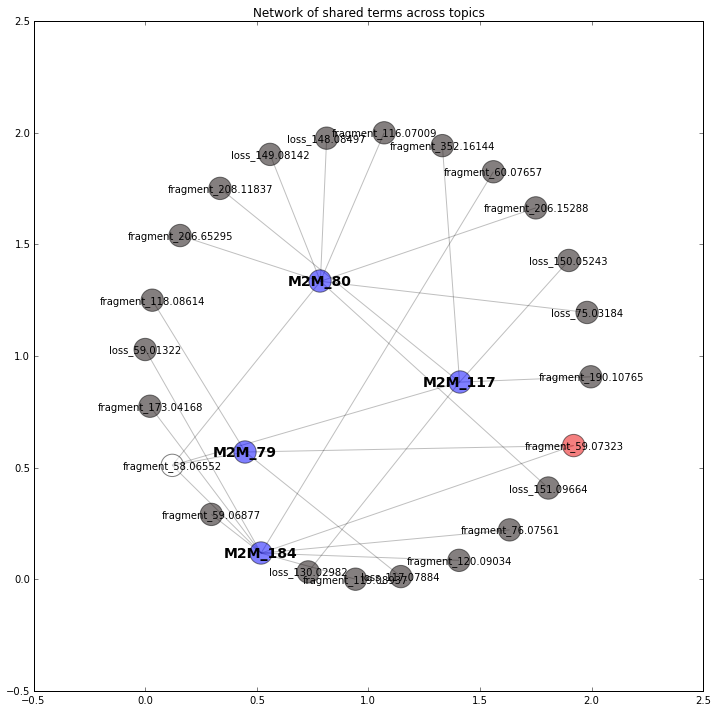

Community 12
Mass2Motif 55: fragment_147.04375, fragment_119.04874, fragment_91.05413, loss_130.12154, fragment_65.03878, loss_186.11136, loss_158.11694, fragment_114.10279, fragment_439.21695, loss_163.06342, fragment_277.16473, 

Mass2Motif 82: fragment_98.06001, fragment_131.12915, fragment_114.10279, fragment_278.05564, fragment_157.10838, fragment_60.05587, fragment_55.05466, fragment_97.07643, fragment_165.07004, fragment_425.2164, fragment_321.07496, fragment_207.07981, fragment_235.07587, fragment_295.09907, fragment_273.10905, fragment_293.08022, fragment_178.07822, fragment_189.07017, fragment_205.06529, fragment_291.10614, fragment_194.07199, 

Mass2Motif 160: fragment_365.10697, fragment_96.04413, fragment_266.15956, fragment_439.20057, fragment_114.10279, fragment_291.06354, fragment_115.05435, fragment_247.07445, fragment_189.07017, fragment_263.06912, fragment_207.07981, fragment_98.06001, fragment_219.08066, fragment_265.08814, fragment_216.0282, fragment_157.10838, fra

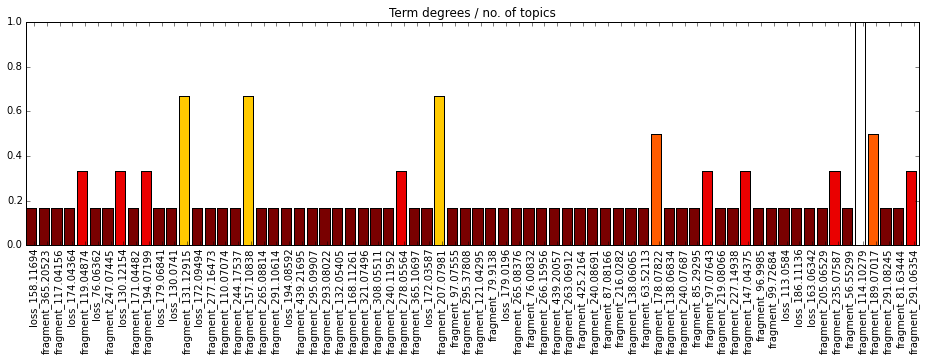

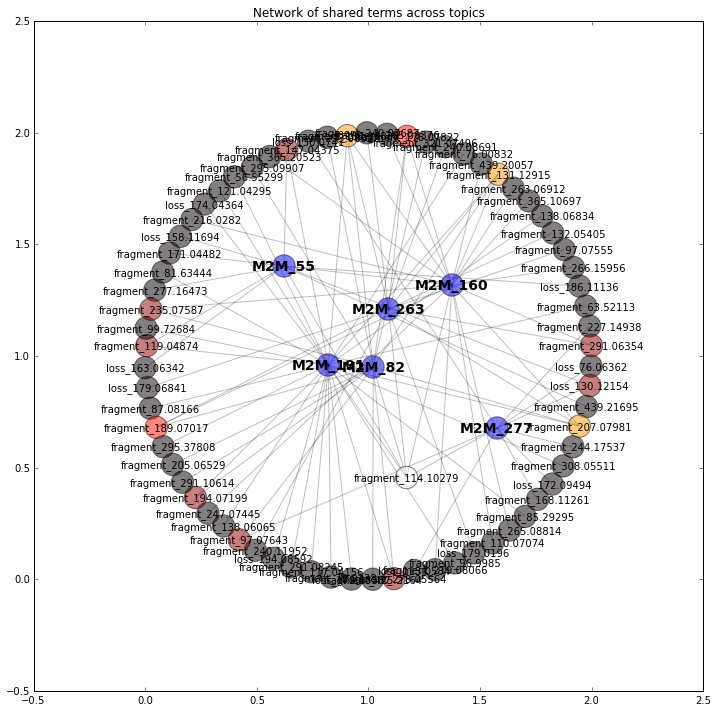

Community 14
Mass2Motif 4: loss_119.09448, fragment_139.03976, loss_168.1509, fragment_251.09015, fragment_259.13175, fragment_343.19133, fragment_287.12852, loss_103.09952, fragment_105.07019, fragment_221.08129, loss_85.08945, fragment_93.06981, fragment_307.18982, fragment_275.1278, fragment_79.05416, fragment_293.13733, fragment_361.20073, fragment_164.10654, loss_175.15717, fragment_119.08567, fragment_149.05998, fragment_203.07149, fragment_289.17908, loss_198.08896, loss_101.08393, fragment_277.14325, fragment_181.04945, loss_184.0733, fragment_57.06999, fragment_67.05454, loss_161.10507, fragment_183.02962, fragment_191.07095, 

Mass2Motif 21: loss_101.04757, fragment_186.07581, loss_56.06123, fragment_221.08129, loss_186.08916, fragment_203.06889, loss_74.07437, fragment_287.12316, fragment_176.87617, fragment_88.03919, loss_198.08896, loss_172.07346, fragment_259.13175, fragment_277.14325, fragment_79.05416, loss_170.05775, loss_157.07343, fragment_107.0856, 

Mass2Motif 22: 

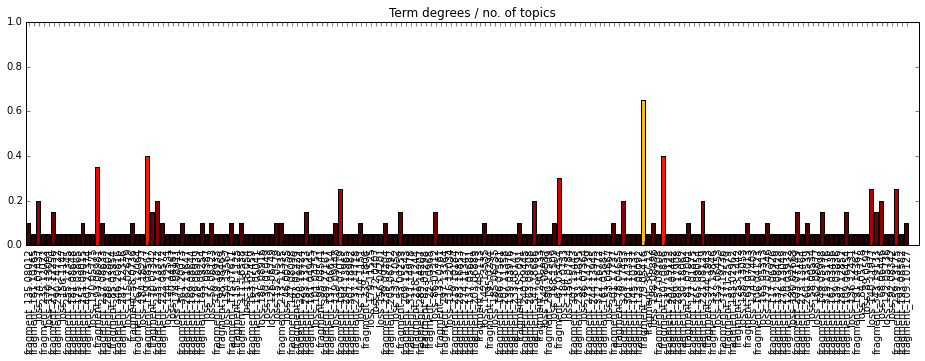

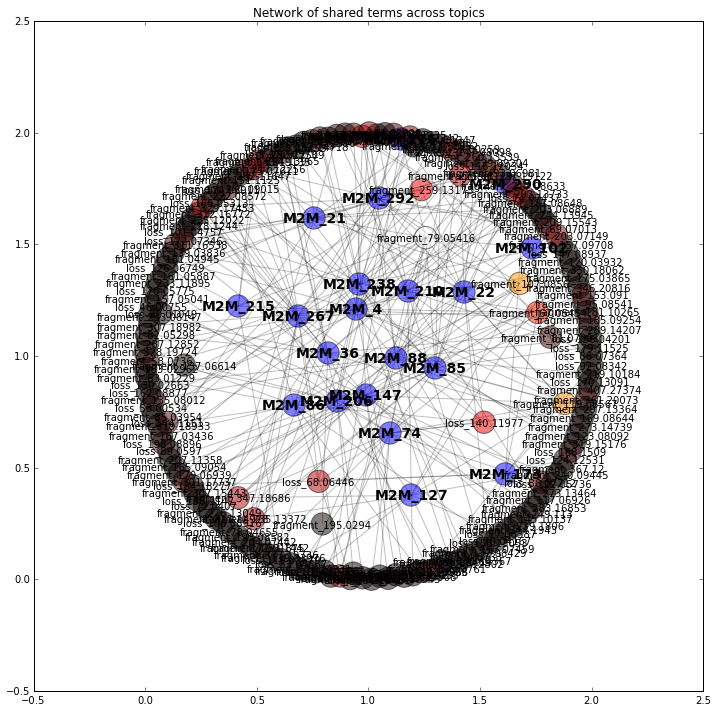

Community 17
Mass2Motif 40: fragment_83.06041, fragment_129.06581, fragment_56.04977, fragment_230.15978, loss_132.09749, fragment_257.12534, 

Mass2Motif 114: fragment_192.06671, fragment_308.14726, loss_45.02001, loss_89.01112, fragment_148.07572, loss_91.0268, loss_119.02144, fragment_147.06747, 

Mass2Motif 152: fragment_227.07791, fragment_227.13947, fragment_135.09196, fragment_210.05357, fragment_83.06041, loss_45.02001, fragment_182.05882, fragment_227.11998, 

Mass2Motif 241: fragment_110.07176, fragment_83.06041, fragment_93.04509, fragment_156.07684, loss_167.08599, loss_191.06155, fragment_363.17581, fragment_56.04977, loss_27.01101, fragment_143.11757, fragment_81.04501, fragment_95.06076, 

Mass2Motif 266: fragment_213.12444, fragment_135.09196, fragment_213.09802, fragment_121.07625, fragment_123.09135, loss_92.04711, loss_78.03166, fragment_122.08333, fragment_195.11187, loss_64.01501, fragment_94.05265, fragment_177.10149, fragment_88.07588, fragment_149.1084, loss_143

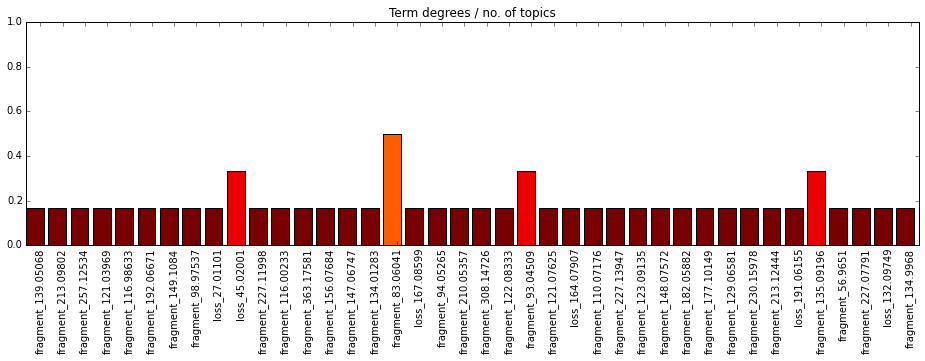

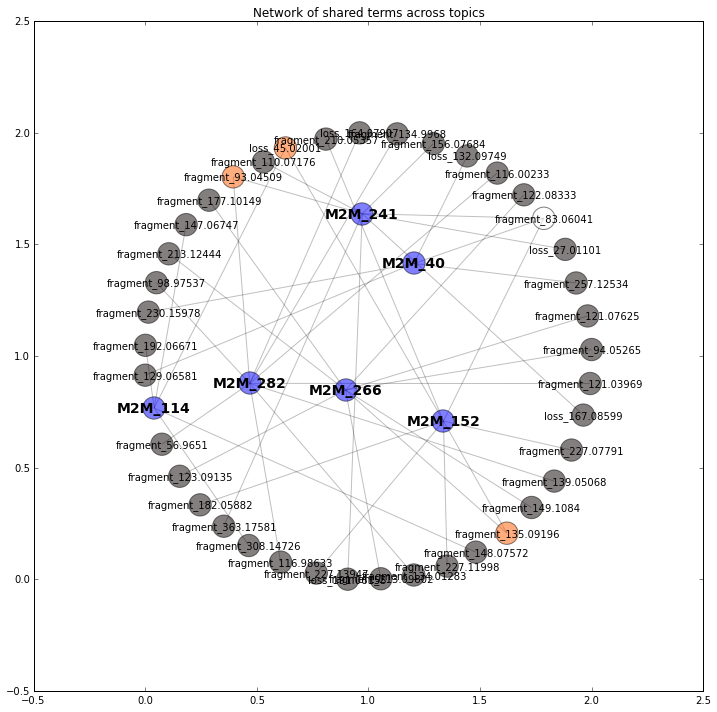

Community 18
Mass2Motif 49: loss_46.04168, loss_92.04711, fragment_56.04977, loss_74.0361, fragment_58.06552, loss_63.06803, loss_90.03155, fragment_102.0547, fragment_74.06031, loss_88.05232, fragment_102.09182, fragment_60.04477, loss_74.07286, loss_42.04695, loss_60.05733, loss_64.05223, loss_73.05269, fragment_106.04977, 

Mass2Motif 66: fragment_74.06031, fragment_56.04977, fragment_190.09762, fragment_102.0547, fragment_120.06539, fragment_220.10874, fragment_400.17517, fragment_102.09182, fragment_238.12006, fragment_57.0337, 

Mass2Motif 70: fragment_207.10526, fragment_189.09504, fragment_74.06031, loss_151.05546, loss_139.05593, fragment_56.04977, loss_138.05259, fragment_87.06307, loss_150.05243, fragment_75.06368, loss_66.03193, loss_168.06319, fragment_57.05319, fragment_159.08459, fragment_98.03236, loss_127.08422, loss_96.04225, fragment_129.0742, fragment_90.06346, 

Mass2Motif 174: fragment_84.0442, fragment_56.04977, 

Mass2Motif 185: fragment_246.09757, fragment_56.0

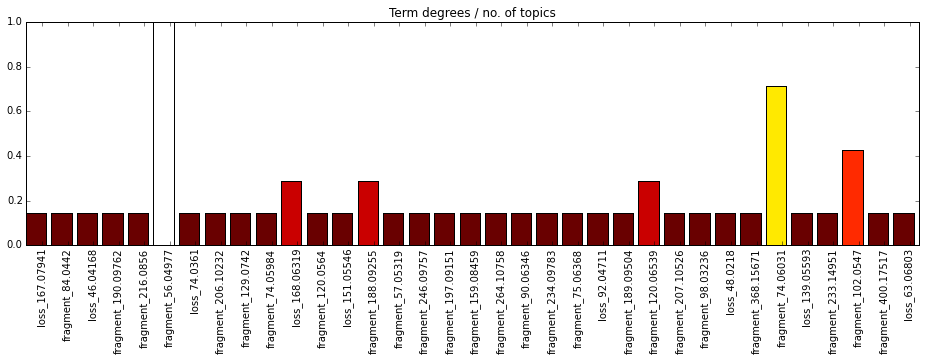

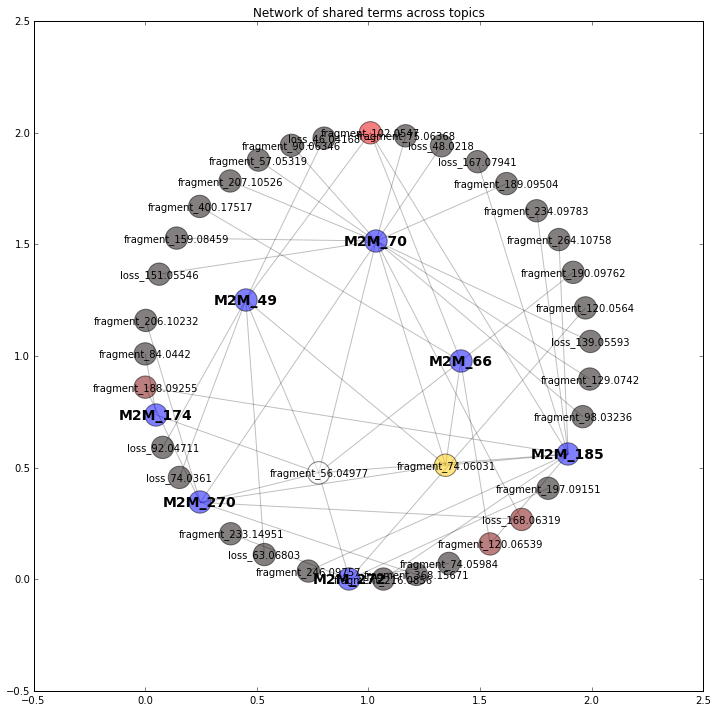

Community 22
Mass2Motif 0: fragment_127.07555, fragment_176.87617, fragment_71.01303, fragment_249.14687, fragment_223.14404, fragment_195.13787, fragment_281.17313, loss_144.07831, fragment_125.04694, fragment_109.07636, loss_114.06821, fragment_177.05475, fragment_177.13989, 

Mass2Motif 38: fragment_176.87617, loss_186.1629, loss_198.16161, loss_172.14599, loss_184.14616, loss_62.00034, fragment_178.0579, fragment_137.06711, loss_196.1459, fragment_277.21736, loss_80.01013, fragment_178.13438, 

Mass2Motif 126: loss_87.03196, fragment_99.00811, fragment_358.25055, fragment_71.01303, loss_115.02679, 

Mass2Motif 140: fragment_71.08573, fragment_97.101, fragment_83.08555, fragment_99.08009, fragment_127.07555, loss_168.1509, fragment_253.10524, loss_188.14087, fragment_338.3407, fragment_55.01824, loss_196.1459, fragment_359.22357, fragment_53.00259, loss_144.1151, fragment_151.11079, fragment_277.21736, fragment_125.09606, loss_170.13091, loss_176.14111, loss_174.12503, fragment_55.0

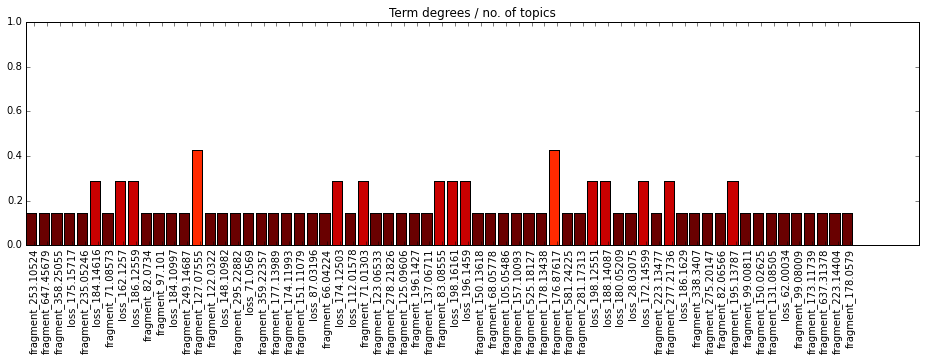

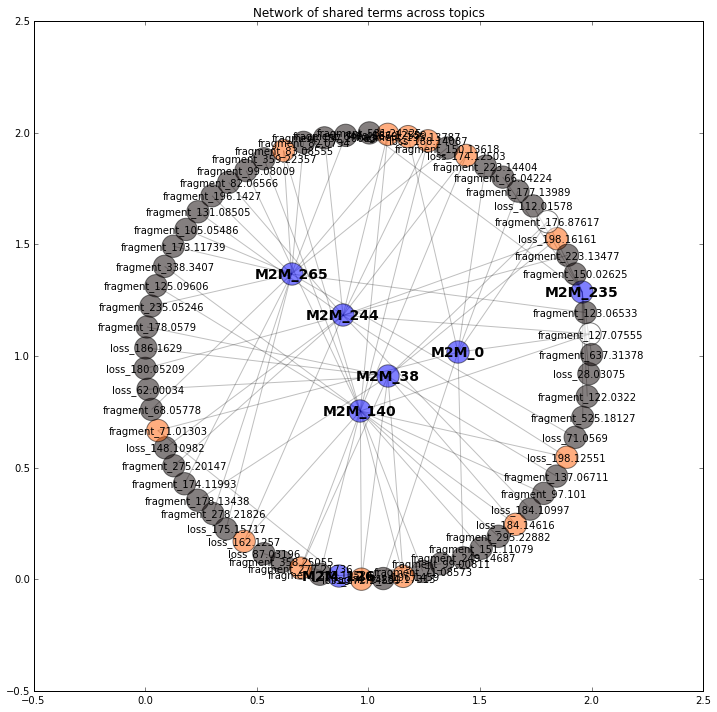

Community 23
Mass2Motif 254: fragment_59.0494, loss_58.0416, fragment_495.26508, loss_134.09398, fragment_327.07817, fragment_551.33331, loss_192.13567, loss_93.07877, fragment_101.02307, loss_81.0427, loss_109.0372, fragment_83.013, loss_127.04826, fragment_129.01856, fragment_175.02333, fragment_117.09074, fragment_607.38599, 

Mass2Motif 278: loss_42.02193, fragment_281.15036, fragment_147.09209, fragment_147.05381, loss_134.09398, fragment_86.03207, fragment_146.0526, 



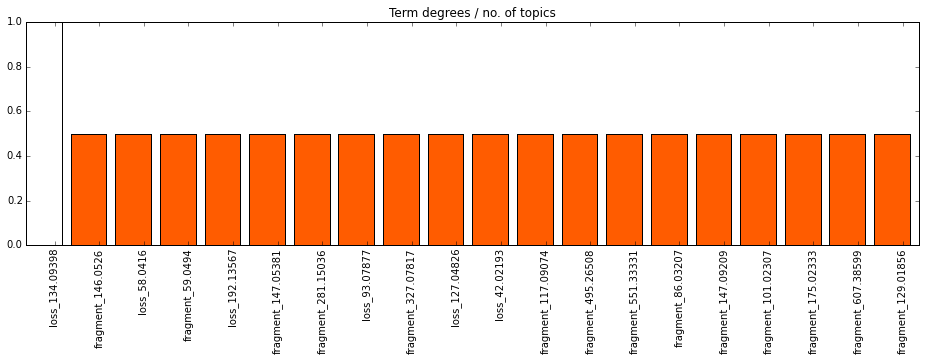

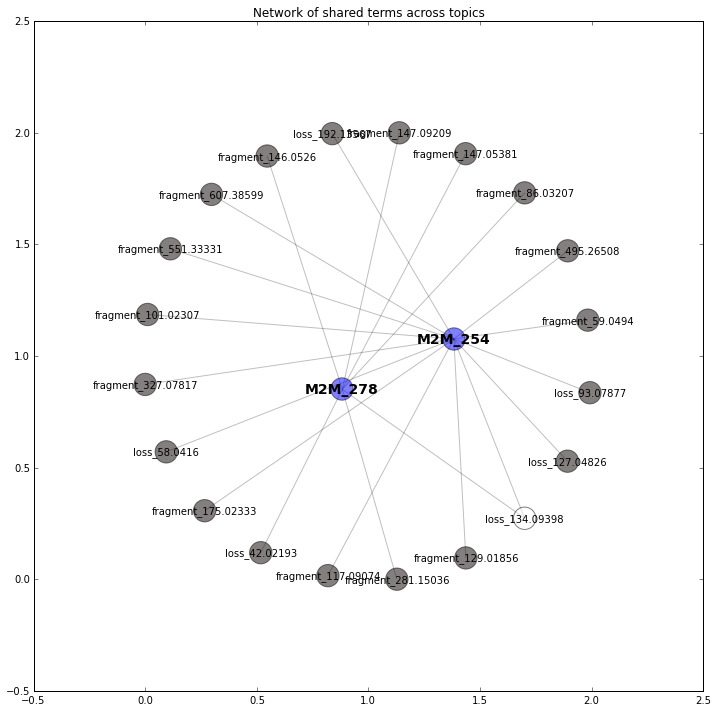

Community 25
Mass2Motif 42: fragment_74.02353, fragment_88.03919, fragment_87.05542, fragment_133.06148, fragment_70.02895, fragment_158.04483, fragment_60.04477, fragment_116.0344, loss_101.04757, fragment_175.12257, loss_188.07979, fragment_88.0218, 

Mass2Motif 44: loss_193.05877, fragment_272.14812, fragment_119.04991, fragment_300.14368, fragment_125.04694, loss_96.04225, fragment_290.161, loss_64.01664, fragment_240.12245, fragment_318.15259, loss_142.04768, fragment_194.11797, fragment_88.03919, fragment_146.11798, fragment_212.12758, fragment_55.01824, fragment_87.03155, loss_147.05336, fragment_98.09683, 

Mass2Motif 56: loss_43.00571, fragment_114.06689, loss_142.02644, fragment_96.06368, fragment_94.06562, loss_61.01619, fragment_114.03797, fragment_86.07147, fragment_72.04466, fragment_114.09123, fragment_155.07991, loss_88.02701, fragment_67.05454, 

Mass2Motif 62: loss_114.05254, fragment_122.06027, loss_100.03718, fragment_67.05454, loss_74.07286, fragment_94.06562, loss

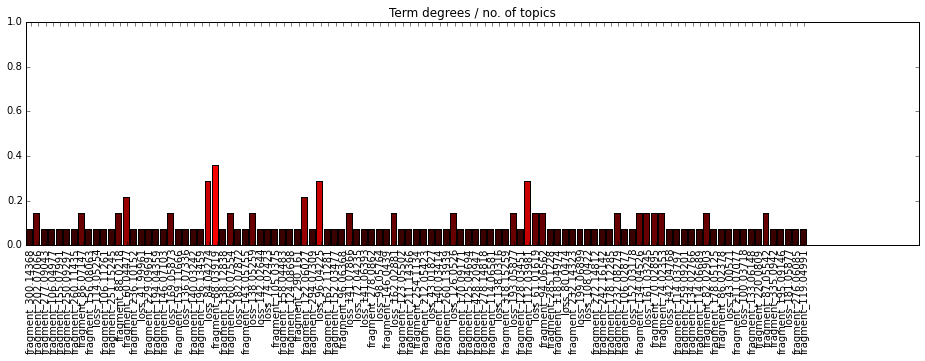

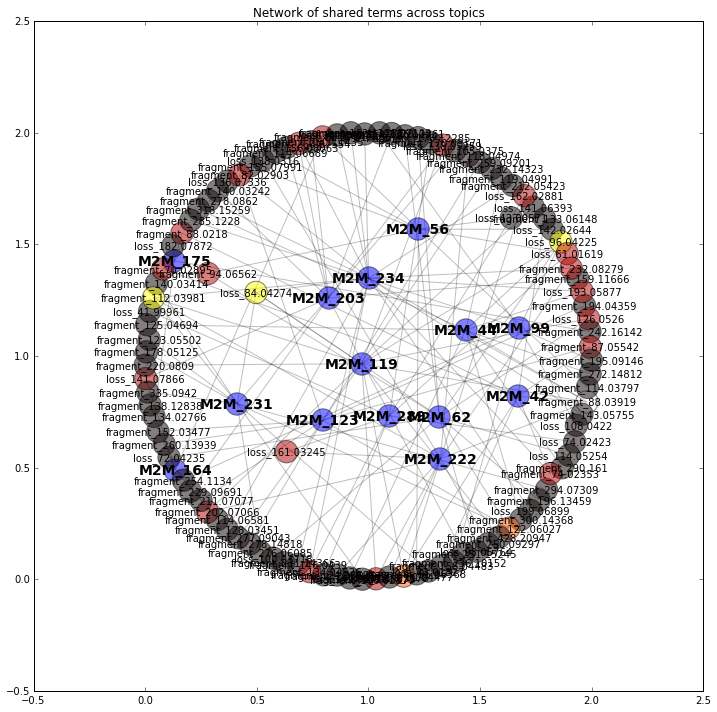

Community 28
Mass2Motif 20: loss_45.02125, loss_91.0268, fragment_130.06468, fragment_175.08705, fragment_132.0441, fragment_158.05976, fragment_157.0768, loss_64.01501, loss_117.04227, 

Mass2Motif 47: fragment_120.0804, fragment_310.12698, fragment_292.11649, fragment_103.05448, fragment_132.08143, fragment_91.05413, fragment_264.12426, fragment_166.08631, fragment_105.07019, loss_196.05793, fragment_130.06468, loss_64.01501, fragment_97.02839, loss_198.07403, fragment_87.03155, fragment_112.03981, fragment_79.05416, fragment_115.05435, fragment_178.08711, fragment_69.03368, fragment_144.08061, fragment_246.11227, fragment_117.05719, 

Mass2Motif 58: fragment_121.06489, fragment_103.05448, fragment_93.06981, fragment_53.03888, fragment_91.05413, fragment_152.10755, loss_68.02601, fragment_138.05067, fragment_166.12292, fragment_95.04936, 

Mass2Motif 101: loss_89.04752, loss_141.0423, loss_91.0268, fragment_134.09685, fragment_161.10742, loss_95.03696, fragment_225.1236, loss_129.078

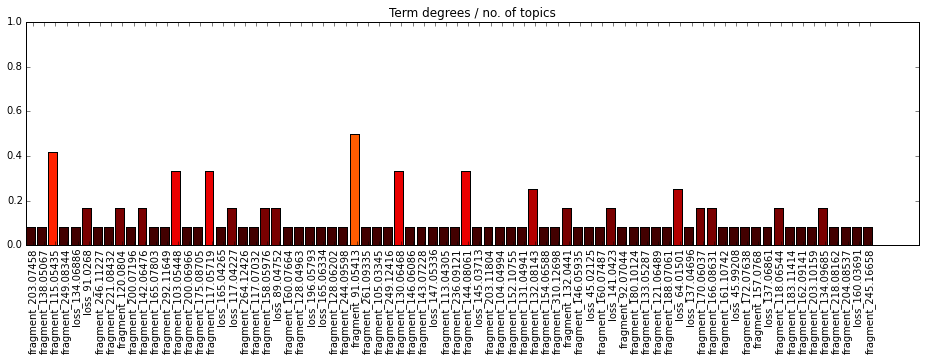

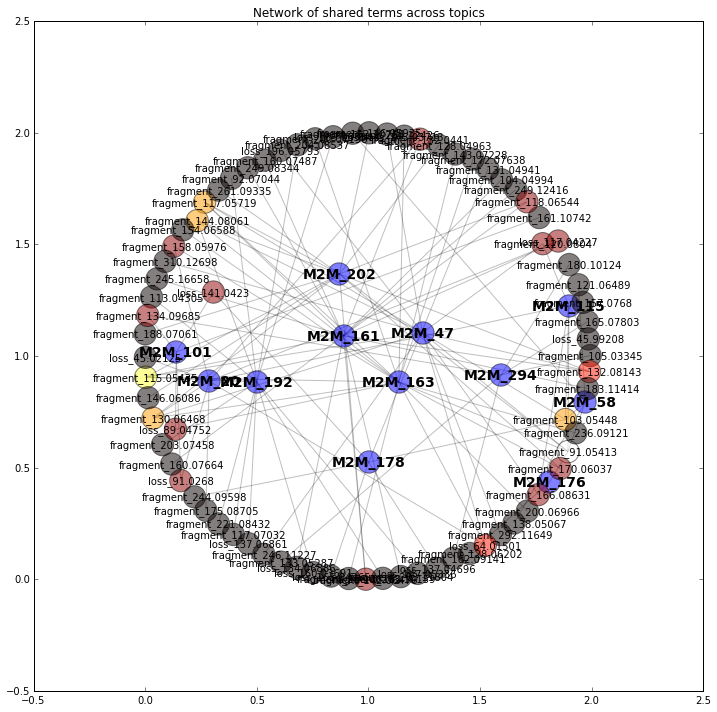

Community 29
Mass2Motif 54: loss_106.02643, fragment_183.10242, fragment_201.11221, loss_64.01595, fragment_95.08541, fragment_137.09633, loss_134.05766, fragment_67.05454, loss_82.02672, loss_110.05754, fragment_119.08567, fragment_160.90206, 

Mass2Motif 67: fragment_179.03302, fragment_68.99719, loss_106.02643, fragment_139.00237, fragment_197.0443, fragment_111.00762, fragment_299.091, fragment_157.01314, loss_72.05724, loss_138.06832, fragment_371.14862, fragment_55.01824, fragment_233.08147, 

Mass2Motif 132: loss_110.02127, loss_82.02672, fragment_59.0494, loss_89.01112, fragment_148.1118, loss_134.02129, loss_98.02127, loss_62.00034, loss_64.01595, fragment_175.12257, fragment_129.05464, loss_124.03724, fragment_67.05454, loss_153.04184, loss_128.03157, fragment_139.03836, loss_54.03249, fragment_147.06565, fragment_94.06475, loss_143.05783, 

Mass2Motif 171: fragment_105.10995, loss_154.0027, loss_172.01297, loss_31.04204, fragment_61.08429, fragment_158.11806, loss_174.01785,

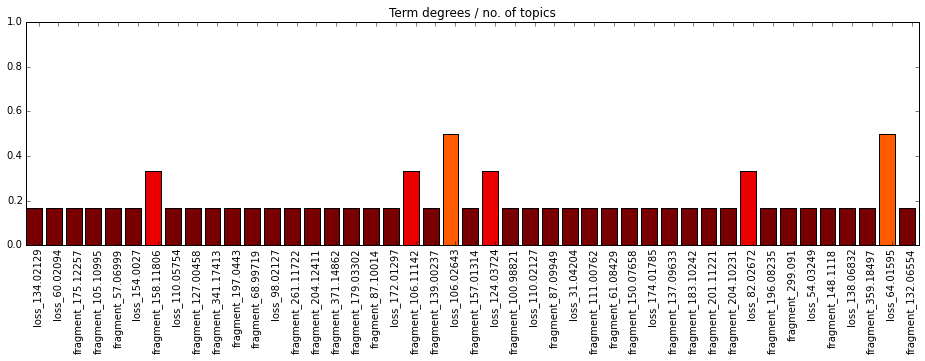

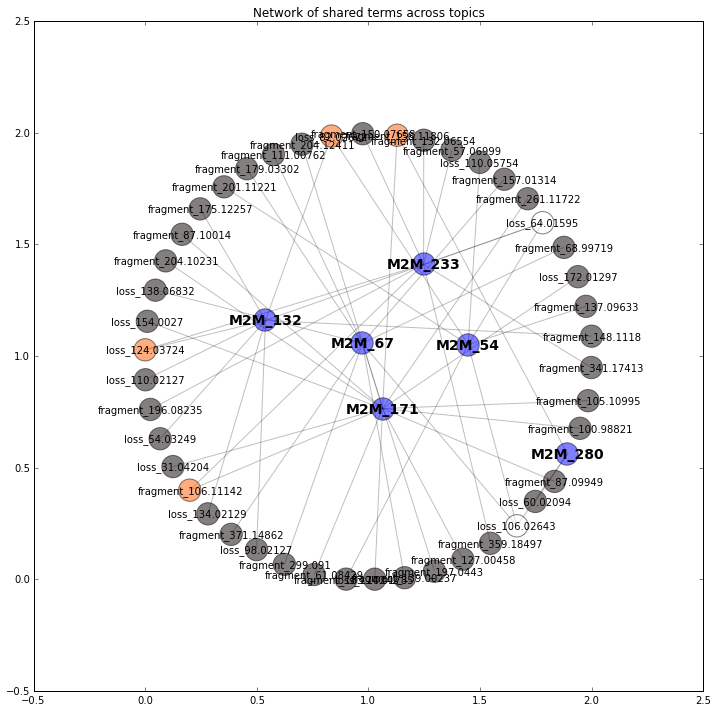

Community 33
Mass2Motif 71: loss_159.08938, fragment_146.11798, fragment_229.15629, loss_189.06327, fragment_357.24902, loss_191.11566, fragment_142.08711, fragment_96.08074, fragment_231.09976, fragment_213.10966, 

Mass2Motif 83: fragment_103.03863, fragment_300.10504, fragment_192.06433, loss_46.00649, fragment_106.06503, loss_132.00566, fragment_79.05416, fragment_157.05041, fragment_81.03334, fragment_109.02882, fragment_238.15515, loss_129.04224, fragment_220.0809, fragment_164.07055, loss_74.0003, loss_157.03725, fragment_219.08742, fragment_154.04951, fragment_238.07132, loss_169.07365, fragment_68.99719, fragment_138.05307, loss_102.03159, fragment_176.1067, loss_130.02663, 

Mass2Motif 148: loss_127.06304, loss_113.04742, fragment_197.12845, loss_101.04757, loss_115.06303, fragment_151.03864, fragment_67.05454, loss_118.07399, loss_99.06819, fragment_179.06939, loss_87.06839, 

Mass2Motif 237: loss_46.00445, fragment_60.04477, loss_132.00566, fragment_146.04575, fragment_174.

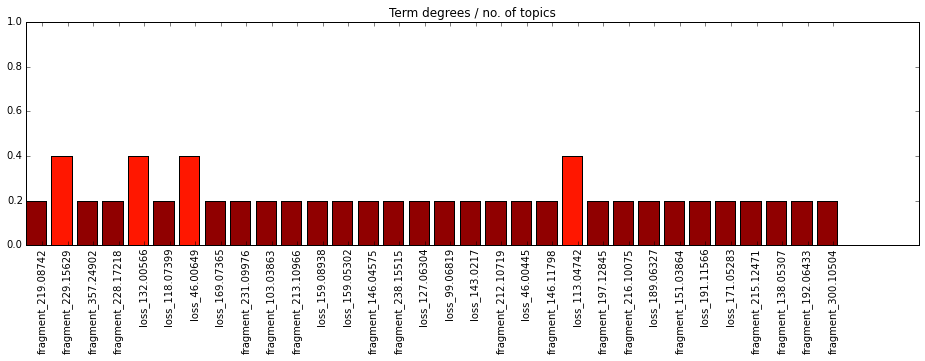

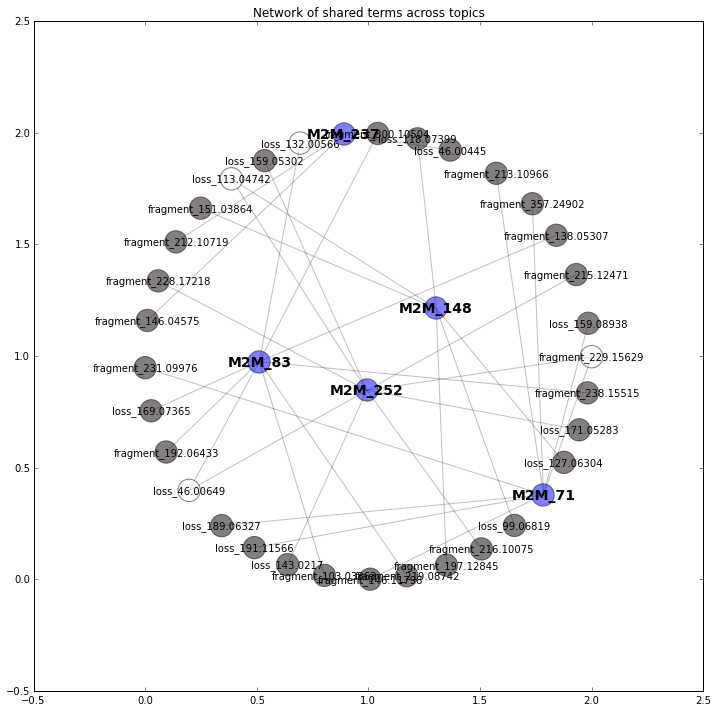

Community 34
Mass2Motif 6: loss_192.06323, fragment_249.11671, fragment_164.04266, fragment_116.07116, fragment_227.10379, fragment_231.10659, fragment_90.04236, fragment_85.04762, loss_193.06563, fragment_182.10112, fragment_136.04759, loss_168.06319, fragment_99.06318, loss_197.06004, fragment_148.0797, fragment_88.04763, fragment_104.07105, 

Mass2Motif 24: fragment_283.10602, loss_161.06841, fragment_140.04987, fragment_185.07114, loss_116.04688, loss_134.05766, fragment_167.0611, fragment_211.08559, fragment_169.07609, loss_132.04207, loss_108.0422, fragment_193.07567, fragment_301.11743, fragment_235.0858, loss_66.03193, fragment_168.06933, loss_133.04918, fragment_222.07951, loss_79.03886, fragment_207.09101, fragment_206.08242, fragment_247.08623, loss_54.03129, loss_94.02667, 

Mass2Motif 151: fragment_116.07116, loss_143.05783, loss_161.06841, loss_115.06303, 

Mass2Motif 156: loss_132.04207, loss_160.03691, loss_149.06869, fragment_102.06629, loss_131.05794, fragment_74.0711

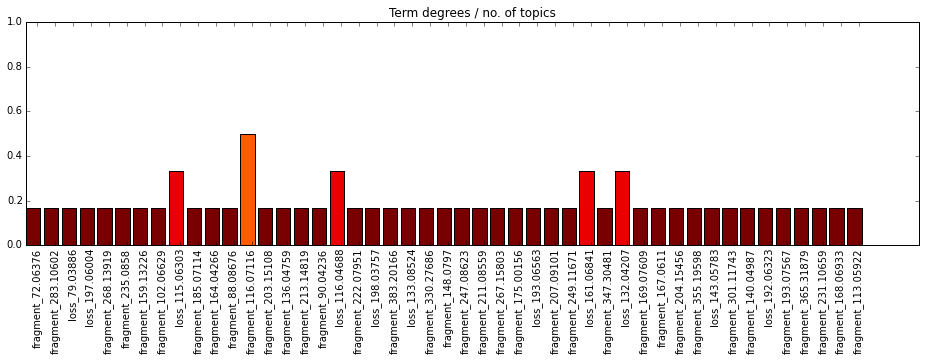

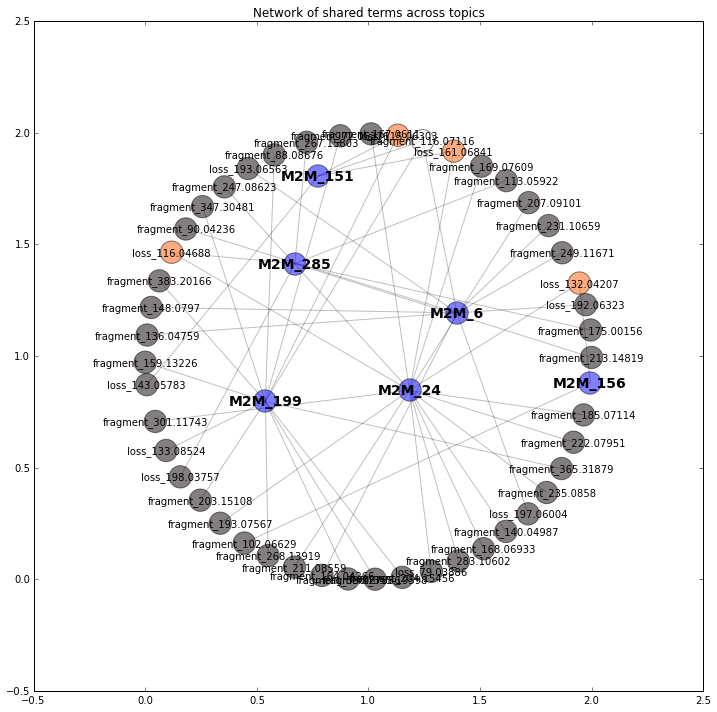

Community 36
Mass2Motif 23: loss_144.04202, loss_190.04752, fragment_127.03868, loss_178.0476, loss_166.04766, loss_194.04244, loss_195.07429, loss_148.037, fragment_55.01824, loss_64.01501, loss_106.02643, fragment_165.05388, 

Mass2Motif 64: loss_135.05329, fragment_62.06022, loss_107.05827, fragment_174.07622, fragment_128.07037, fragment_156.0657, 

Mass2Motif 69: fragment_69.03368, fragment_57.0337, fragment_99.04377, fragment_55.01824, fragment_53.03888, fragment_53.00259, fragment_99.04454, 

Mass2Motif 73: loss_170.07908, fragment_93.05447, fragment_57.0337, loss_198.07403, fragment_75.04398, loss_186.07345, fragment_152.05609, loss_158.07918, loss_128.06865, loss_110.05754, loss_194.07849, fragment_145.04997, fragment_127.03868, loss_174.07403, 

Mass2Motif 78: fragment_305.08185, fragment_115.03695, loss_190.04752, fragment_143.08199, fragment_186.07581, fragment_112.11986, fragment_70.07288, fragment_95.05996, 

Mass2Motif 94: loss_120.07847, loss_144.04202, fragment_237.074

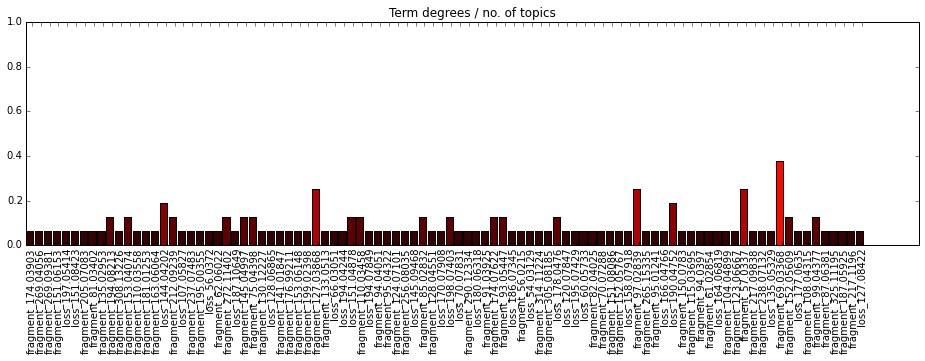

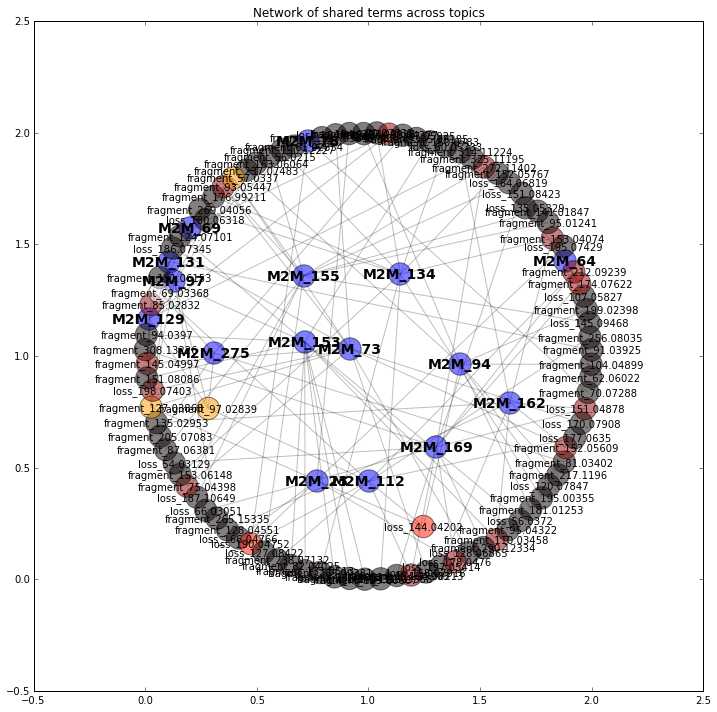

Community 39
Mass2Motif 5: fragment_212.09535, fragment_166.12292, fragment_212.14796, fragment_58.06552, fragment_80.04949, fragment_123.01115, loss_142.06266, loss_46.02468, fragment_148.1118, fragment_90.09115, fragment_108.04425, loss_132.09749, loss_132.07864, fragment_59.0494, fragment_82.06499, loss_141.07866, loss_64.01664, fragment_98.06001, 

Mass2Motif 13: loss_146.06849, fragment_147.07588, loss_192.07446, fragment_419.15237, loss_129.04224, loss_188.07979, fragment_101.07126, loss_168.1509, loss_183.08923, fragment_89.10724, loss_134.10512, loss_174.06386, fragment_130.05051, loss_164.07907, loss_145.08506, 

Mass2Motif 146: loss_185.09012, loss_125.06876, fragment_178.08509, fragment_270.1326, fragment_270.0986, loss_143.07942, loss_162.07274, fragment_270.04002, fragment_108.04425, 

Mass2Motif 218: loss_129.04224, loss_175.04802, loss_175.08433, loss_177.09988, loss_192.07446, 

Mass2Motif 219: loss_125.06876, loss_175.08433, loss_32.02583, fragment_245.13014, loss_80.0

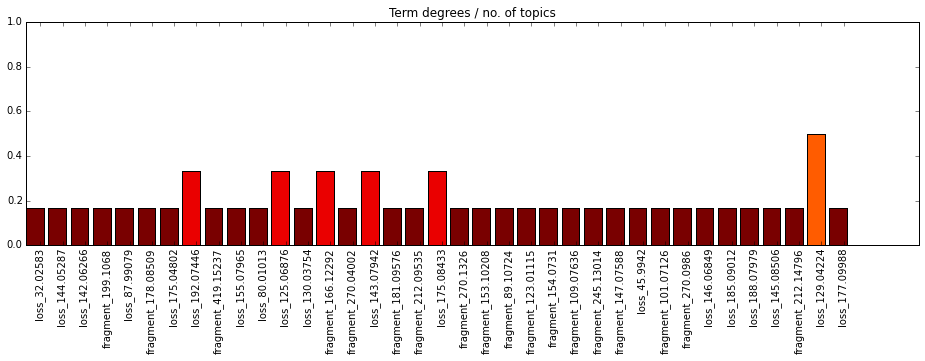

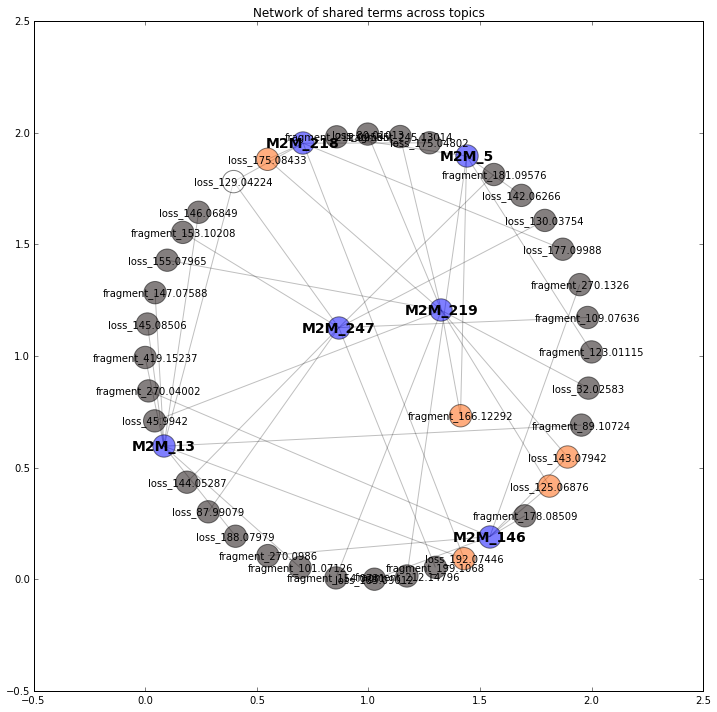

Community 41
Mass2Motif 130: fragment_112.05105, fragment_113.05456, fragment_95.02389, loss_133.04527, fragment_96.02703, fragment_113.04771, fragment_125.03493, fragment_69.04506, fragment_100.03925, fragment_191.04568, fragment_209.05505, loss_43.00571, fragment_155.04439, 

Mass2Motif 135: loss_113.08393, fragment_303.05017, loss_114.04263, loss_76.05234, fragment_166.09863, loss_145.1099, loss_157.07343, loss_115.06303, fragment_69.04506, loss_160.08466, 

Mass2Motif 288: loss_74.03681, fragment_121.10155, fragment_167.1548, loss_86.03669, loss_76.05234, loss_91.06316, fragment_53.03888, fragment_158.08228, fragment_149.1084, fragment_121.08374, 



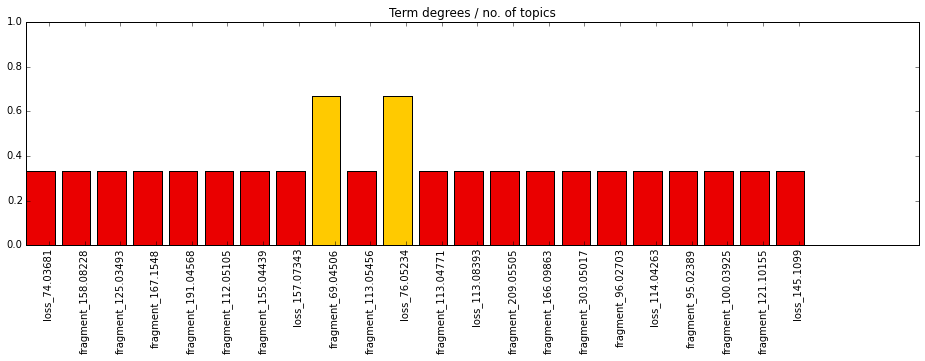

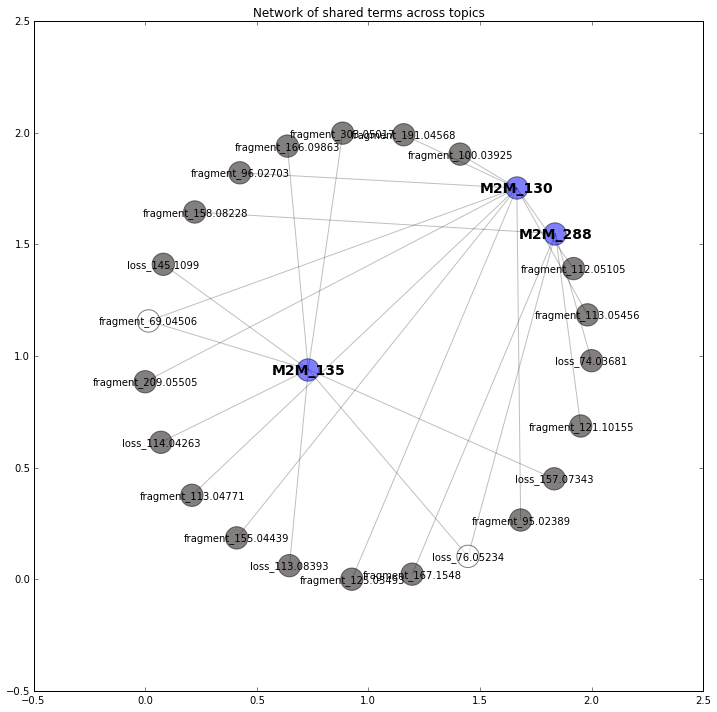

Community 45
Mass2Motif 19: fragment_177.05475, fragment_89.03864, fragment_145.02839, fragment_117.03316, fragment_364.22203, fragment_149.05998, fragment_307.17496, loss_137.08402, loss_130.12154, loss_193.07267, loss_176.10859, fragment_100.07536, fragment_171.1487, fragment_134.03657, fragment_78.04655, fragment_234.11111, 

Mass2Motif 26: fragment_89.03864, fragment_163.03896, loss_74.0003, fragment_135.0444, loss_192.12162, fragment_117.03316, fragment_147.07588, fragment_145.02839, fragment_63.02327, loss_100.01582, 

Mass2Motif 48: fragment_309.08884, fragment_205.07604, fragment_263.08124, fragment_281.09244, fragment_206.08242, fragment_215.13959, fragment_206.08541, fragment_215.0527, fragment_164.09266, loss_104.0108, fragment_180.08065, fragment_177.05681, 

Mass2Motif 95: loss_76.0159, loss_74.0003, loss_91.0268, fragment_165.07004, fragment_228.10048, fragment_182.09616, loss_89.02361, fragment_180.08065, fragment_115.05435, fragment_167.07342, fragment_155.08475, loss_1

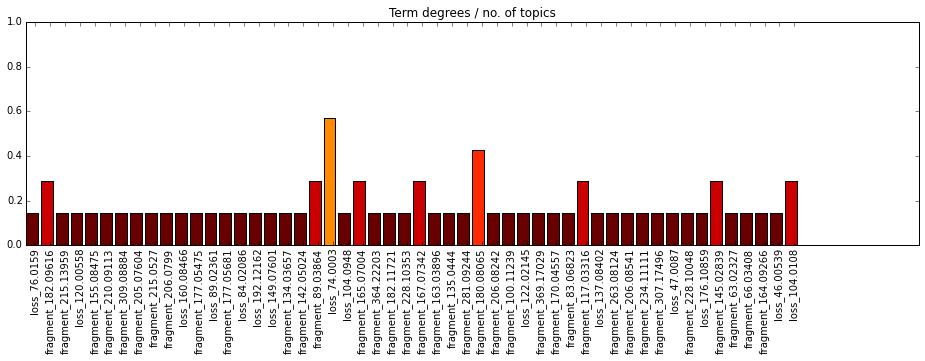

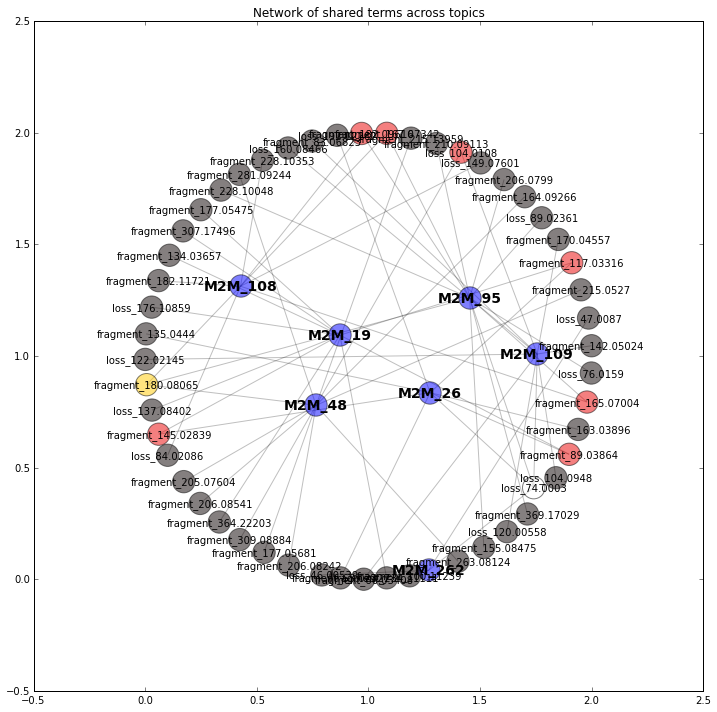

Community 46
Mass2Motif 11: fragment_302.12175, fragment_260.11143, fragment_100.07536, fragment_128.07037, fragment_284.11069, fragment_242.10031, fragment_422.16339, fragment_182.07858, fragment_112.07584, fragment_116.07116, fragment_214.10785, fragment_232.1195, fragment_68.04977, loss_96.04225, loss_64.01501, fragment_224.09232, fragment_404.15125, loss_46.00755, loss_192.06323, fragment_274.12643, fragment_143.03187, 

Mass2Motif 16: fragment_225.1236, fragment_274.12643, loss_84.04274, fragment_82.06499, loss_181.0949, fragment_128.07037, fragment_246.13417, fragment_296.15974, fragment_98.09683, fragment_273.14286, fragment_164.10654, fragment_81.03334, fragment_256.11932, fragment_110.05978, fragment_147.11301, fragment_212.12758, fragment_55.05466, fragment_199.1068, fragment_142.08566, fragment_114.09123, fragment_351.21115, fragment_96.08074, 

Mass2Motif 39: loss_123.05309, fragment_82.06499, fragment_187.108, fragment_141.10263, fragment_55.05466, fragment_851.27069, frag

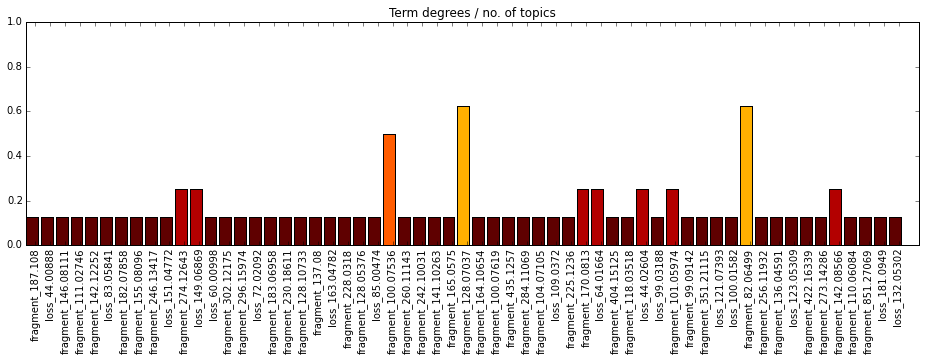

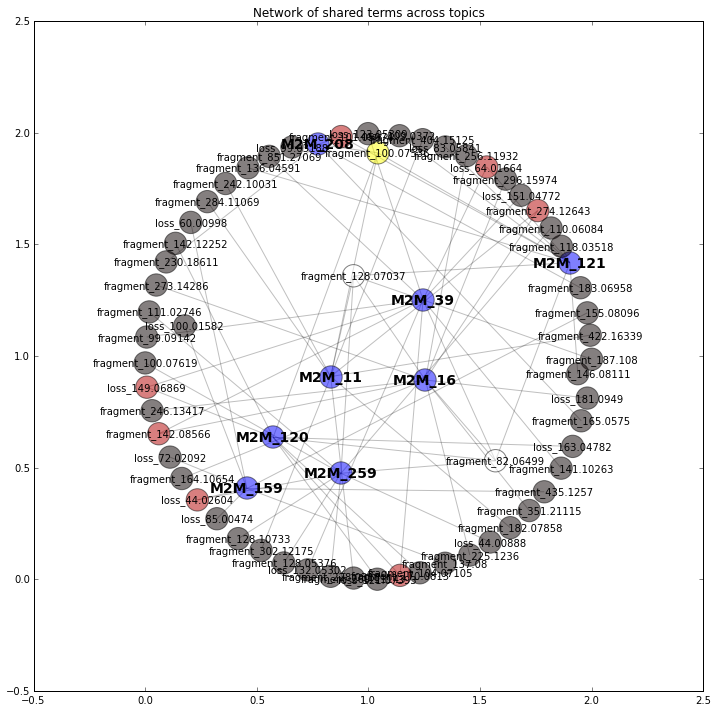

Community 49
Mass2Motif 15: fragment_60.08102, loss_133.10962, loss_159.12561, fragment_202.978, 

Mass2Motif 105: fragment_184.07228, fragment_124.99931, loss_168.07692, fragment_71.07325, loss_85.08945, loss_59.07393, fragment_60.08102, fragment_56.04977, 

Mass2Motif 107: loss_59.07393, loss_105.07881, fragment_239.11333, fragment_193.10912, fragment_190.16226, loss_129.07871, fragment_189.15918, fragment_121.07625, loss_130.08222, fragment_148.08794, fragment_130.08705, fragment_131.0893, loss_132.08964, fragment_133.0761, 

Mass2Motif 145: loss_145.07367, loss_173.06826, fragment_289.1514, fragment_76.03918, fragment_366.08148, fragment_174.0873, fragment_185.04238, fragment_232.13289, loss_75.03184, fragment_136.06089, fragment_226.12024, 

Mass2Motif 217: loss_173.14115, fragment_254.10202, loss_133.10962, fragment_122.06027, loss_53.04788, fragment_175.14848, loss_173.06826, loss_158.0579, loss_119.09448, loss_66.03051, fragment_188.07061, loss_159.12561, loss_145.1099, fragmen

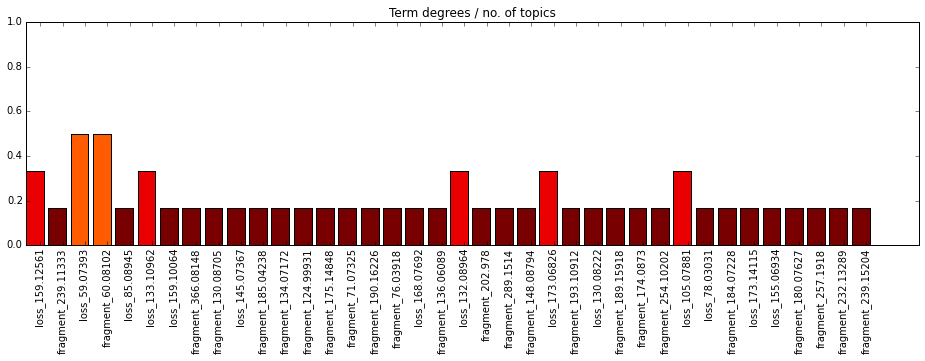

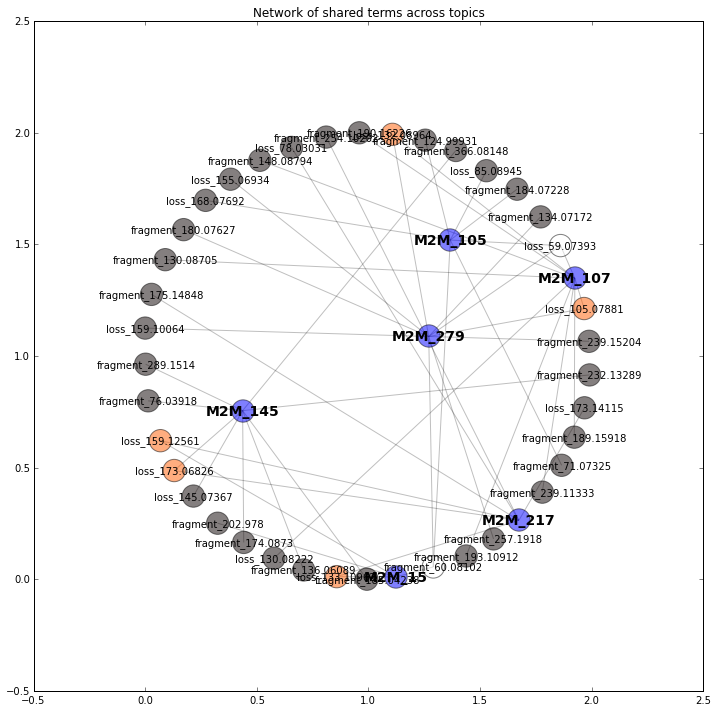

Community 50
Mass2Motif 50: fragment_127.05087, fragment_110.02365, loss_116.08318, fragment_109.03967, fragment_109.04827, fragment_54.03418, fragment_82.02903, fragment_117.05474, fragment_56.04977, fragment_127.05768, loss_133.10962, 

Mass2Motif 181: loss_102.06801, loss_116.08318, loss_114.06821, loss_130.09925, loss_128.08347, loss_104.08402, loss_88.05232, loss_56.06255, loss_140.08358, fragment_65.03878, loss_144.1151, loss_100.05231, loss_126.06749, loss_86.07364, fragment_109.06454, fragment_195.13545, 

Mass2Motif 223: fragment_172.09769, loss_133.07377, fragment_200.09087, loss_114.06821, fragment_104.03429, fragment_154.08736, loss_149.03218, loss_64.01501, loss_148.037, loss_132.00566, fragment_116.0344, loss_102.06801, fragment_218.10311, loss_134.05766, loss_121.07393, loss_92.01076, fragment_74.06031, fragment_126.09191, loss_144.04202, 

Mass2Motif 246: loss_87.06839, fragment_393.13831, loss_133.07377, fragment_217.15556, fragment_217.06834, loss_136.03725, fragment_

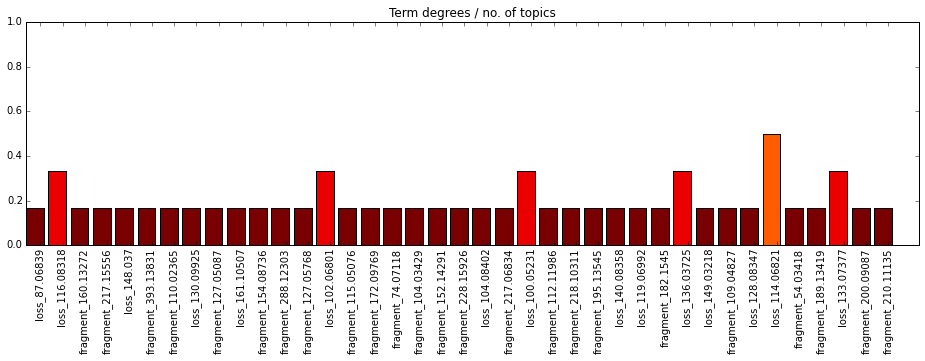

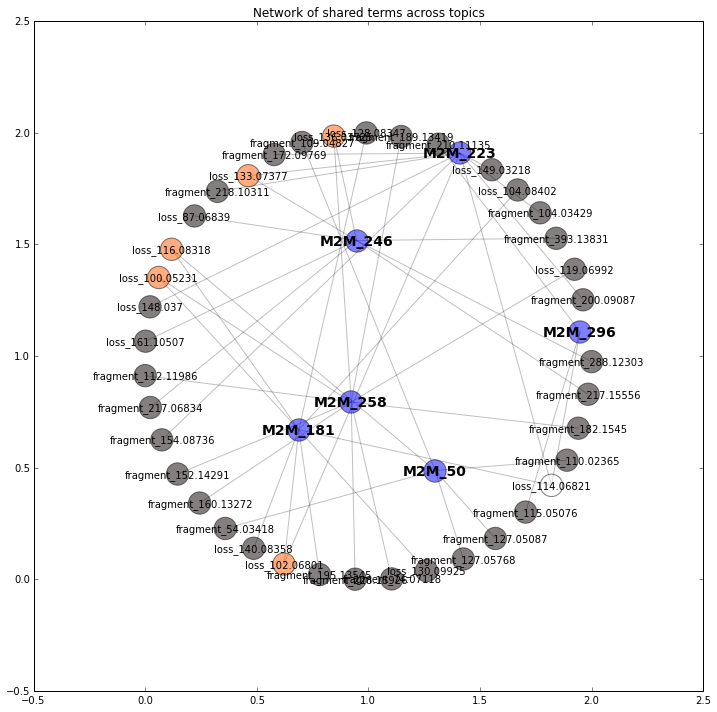

Community 51
Mass2Motif 98: fragment_98.06001, fragment_144.0659, fragment_381.08163, fragment_297.16275, 

Mass2Motif 193: loss_59.07313, fragment_88.04763, fragment_147.09706, fragment_87.06307, loss_60.07694, loss_104.0948, fragment_64.92754, fragment_60.05587, fragment_180.13744, loss_61.02852, fragment_70.03679, fragment_119.06843, loss_77.08387, fragment_105.0742, 

Mass2Motif 196: fragment_231.08324, fragment_195.08393, fragment_158.09737, fragment_86.06016, fragment_143.07379, fragment_99.06318, fragment_98.06001, fragment_87.06307, fragment_120.06539, fragment_97.02839, fragment_213.09547, fragment_98.03152, fragment_69.03368, fragment_183.08368, fragment_130.06468, fragment_74.05984, fragment_168.0817, fragment_56.04977, fragment_188.07061, loss_133.04527, fragment_70.03679, fragment_102.0547, fragment_214.08713, fragment_71.06872, loss_134.07748, loss_144.04202, 

Mass2Motif 209: fragment_86.06016, fragment_69.03368, 

Mass2Motif 212: fragment_248.11291, fragment_184.04371, 

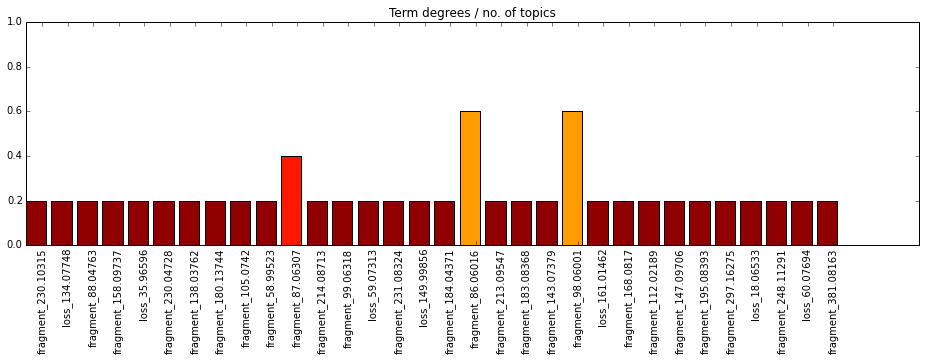

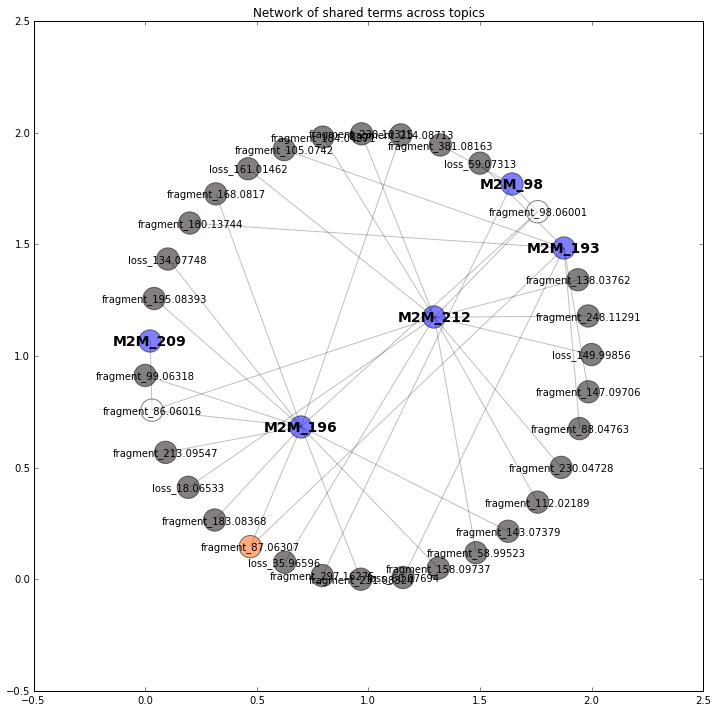

Community 52
Mass2Motif 14: loss_87.0795, fragment_127.06998, loss_46.02468, loss_59.04824, fragment_115.07544, fragment_84.06386, fragment_174.12434, loss_88.06361, fragment_110.04319, fragment_130.07016, fragment_84.05797, 

Mass2Motif 18: loss_59.04824, fragment_114.09123, fragment_689.20276, fragment_271.11212, loss_101.05958, fragment_217.12872, fragment_173.13892, fragment_156.11388, fragment_113.10699, fragment_158.08046, fragment_115.08708, fragment_72.04466, loss_146.07951, 

Mass2Motif 61: loss_17.97339, fragment_90.09183, fragment_142.08711, loss_86.00034, fragment_160.13426, fragment_76.03918, loss_91.0268, fragment_124.07522, loss_35.9844, loss_101.99542, loss_59.98468, 

Mass2Motif 87: loss_59.04824, fragment_146.09283, fragment_128.08134, fragment_60.05587, loss_77.05878, fragment_111.05547, loss_71.07349, fragment_104.07105, loss_86.03669, loss_35.03689, 

Mass2Motif 96: fragment_142.08711, fragment_228.14619, fragment_293.08487, fragment_169.09672, fragment_141.10263, 

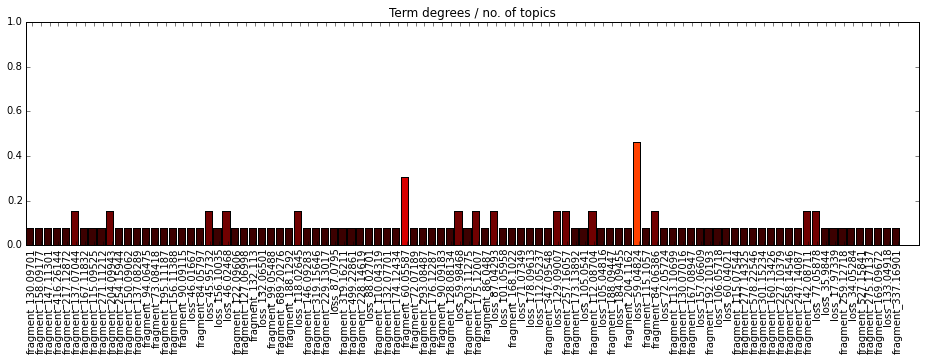

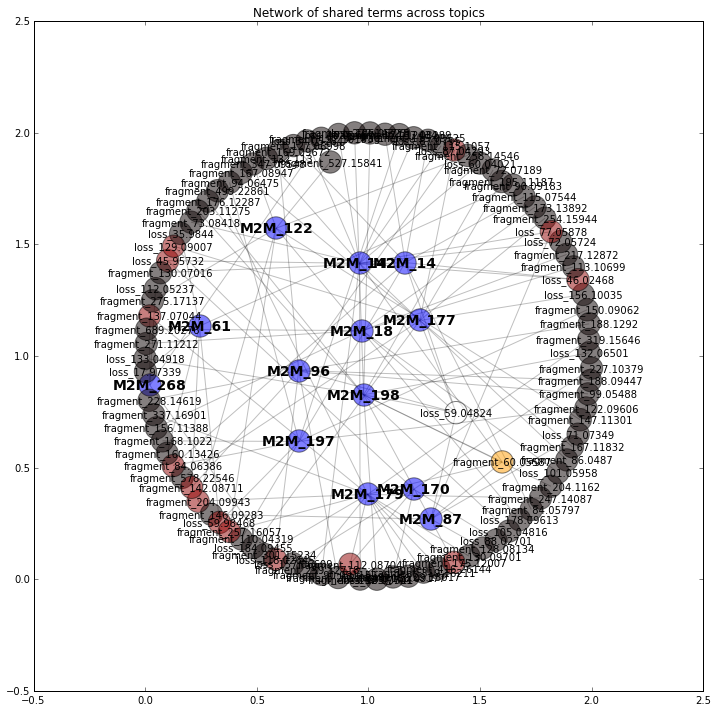

Community 56
Mass2Motif 27: fragment_71.04937, fragment_55.01824, loss_112.01945, fragment_117.05474, fragment_53.03888, loss_79.06303, fragment_181.09105, 

Mass2Motif 90: loss_78.03166, loss_94.02667, loss_66.03193, loss_62.03678, loss_112.01945, loss_90.03155, loss_106.02643, fragment_109.02882, fragment_186.05889, loss_102.03159, loss_92.01076, fragment_64.92754, loss_64.01664, fragment_101.11551, fragment_126.05563, fragment_61.02895, loss_82.02672, fragment_123.96388, loss_72.02092, fragment_53.03888, 

Mass2Motif 91: fragment_108.04425, fragment_80.04949, fragment_53.03888, fragment_126.05563, loss_55.00558, loss_58.00534, fragment_55.01824, loss_41.02668, loss_60.04021, loss_23.01523, fragment_75.02734, fragment_68.01311, loss_86.00034, loss_40.03137, loss_101.01104, fragment_88.05865, 

Mass2Motif 104: fragment_80.04949, fragment_164.0346, fragment_182.08217, loss_86.00034, loss_86.03669, loss_102.03159, loss_101.99542, fragment_136.03971, loss_18.04478, loss_95.03696, fragmen

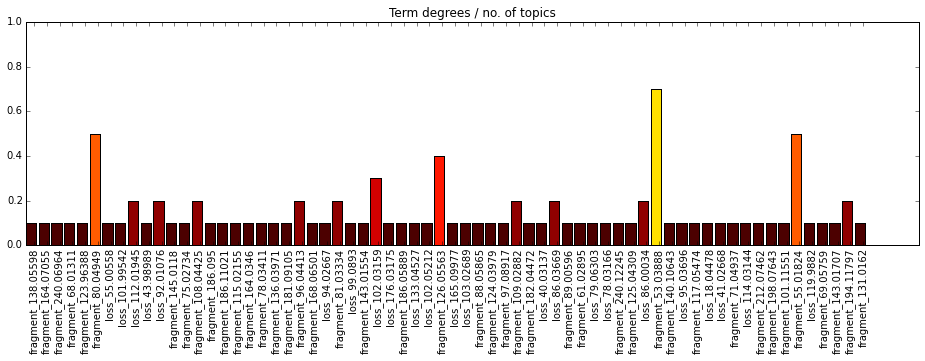

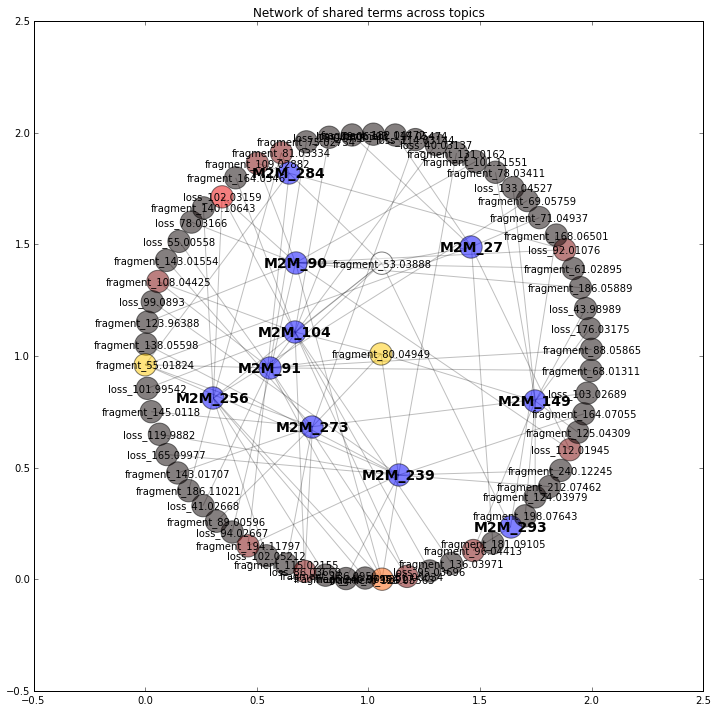

Community 60
Mass2Motif 1: loss_156.05307, fragment_112.04998, loss_142.07387, fragment_244.07787, loss_132.02912, loss_101.04757, fragment_95.02389, 

Mass2Motif 17: fragment_136.07599, fragment_182.08217, fragment_123.04467, fragment_165.05388, fragment_160.90206, fragment_119.04874, fragment_102.0547, fragment_95.04936, fragment_247.1084, fragment_161.0686, fragment_119.04991, fragment_165.05578, fragment_154.08575, loss_170.06884, 

Mass2Motif 35: fragment_95.04936, fragment_143.03187, fragment_202.068, fragment_137.10702, fragment_137.05989, fragment_109.02882, fragment_137.07044, loss_43.01827, fragment_94.04141, loss_41.99961, fragment_95.05996, 

Mass2Motif 72: fragment_150.05583, fragment_196.0979, fragment_178.04896, fragment_178.08711, fragment_95.04936, loss_46.04101, fragment_135.03122, fragment_81.03334, fragment_122.06027, loss_101.01104, fragment_136.07599, loss_115.02679, loss_101.04757, fragment_150.09062, loss_61.02852, loss_100.05231, fragment_107.03635, fragment_96

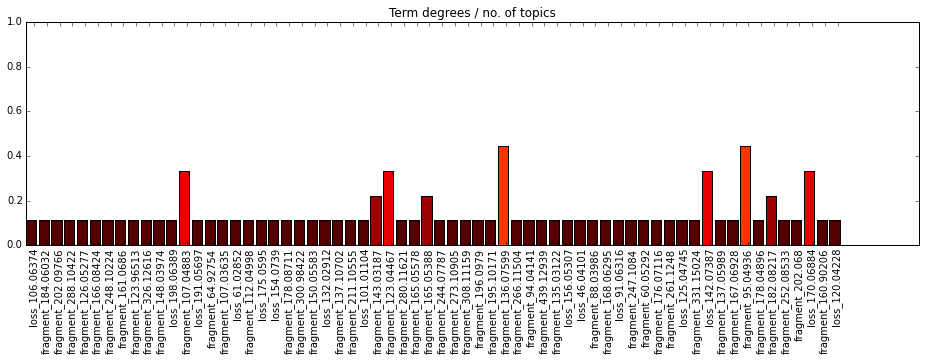

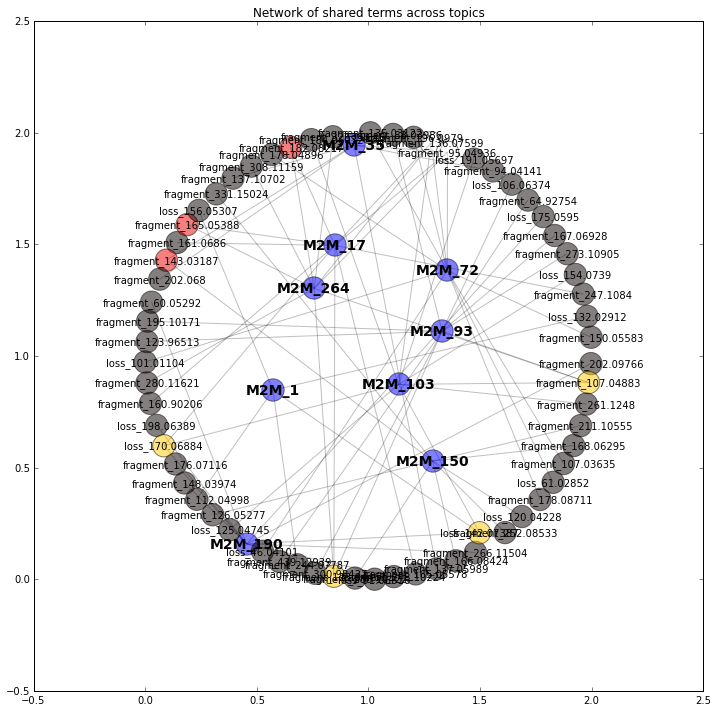

Community 62
Mass2Motif 9: fragment_61.01086, fragment_56.04977, fragment_276.0913, fragment_104.05303, fragment_150.05915, fragment_133.0324, fragment_294.10156, fragment_350.1196, loss_131.05794, fragment_87.02618, fragment_88.03919, fragment_180.0875, fragment_144.0659, fragment_75.02618, fragment_230.08325, 

Mass2Motif 37: fragment_90.05533, loss_130.06265, fragment_202.109, fragment_70.02895, fragment_184.09815, fragment_220.12064, fragment_220.11823, fragment_116.0344, fragment_67.05454, fragment_124.07522, fragment_72.04466, fragment_133.06301, loss_150.08907, fragment_202.09766, fragment_98.02403, fragment_95.04936, 

Mass2Motif 125: fragment_61.01086, fragment_120.04802, fragment_103.02173, fragment_78.03739, fragment_191.0857, loss_71.03691, loss_88.06361, fragment_72.04466, fragment_60.04477, loss_101.04757, fragment_103.02119, fragment_149.07374, fragment_162.09141, loss_130.0741, fragment_102.03702, fragment_73.0285, loss_113.04742, 

Mass2Motif 157: fragment_176.96088, l

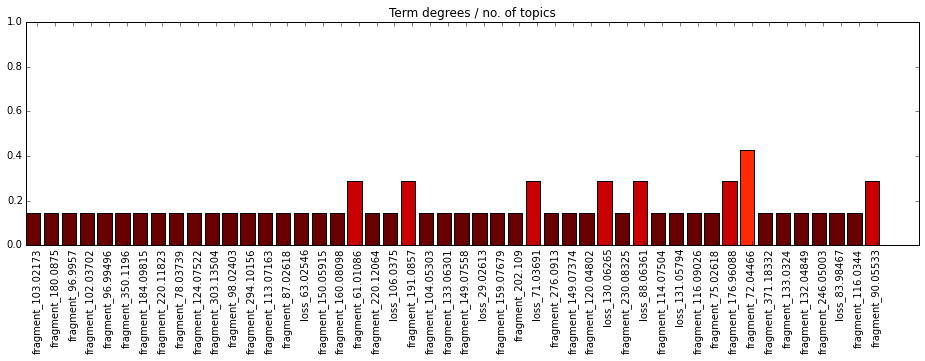

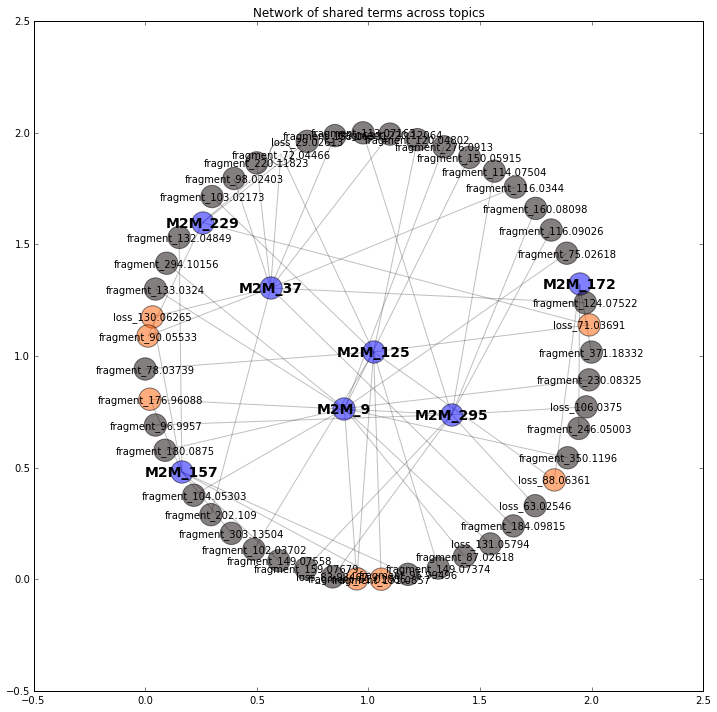

Community 68
Mass2Motif 8: fragment_153.06581, fragment_122.06806, fragment_303.15518, fragment_155.03355, fragment_261.11316, fragment_211.09688, loss_68.02601, fragment_279.12275, loss_130.09925, fragment_107.06037, fragment_152.10585, loss_181.07293, fragment_104.05799, loss_188.06804, fragment_53.03888, fragment_92.05779, loss_17.97339, fragment_261.14915, fragment_94.07337, fragment_279.15812, 

Mass2Motif 283: fragment_261.11316, fragment_367.18692, fragment_385.20139, fragment_205.05127, fragment_205.04847, loss_124.0275, loss_180.09019, 



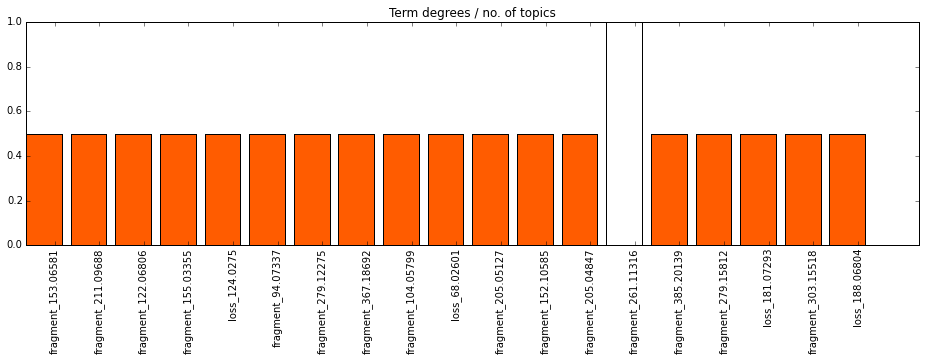

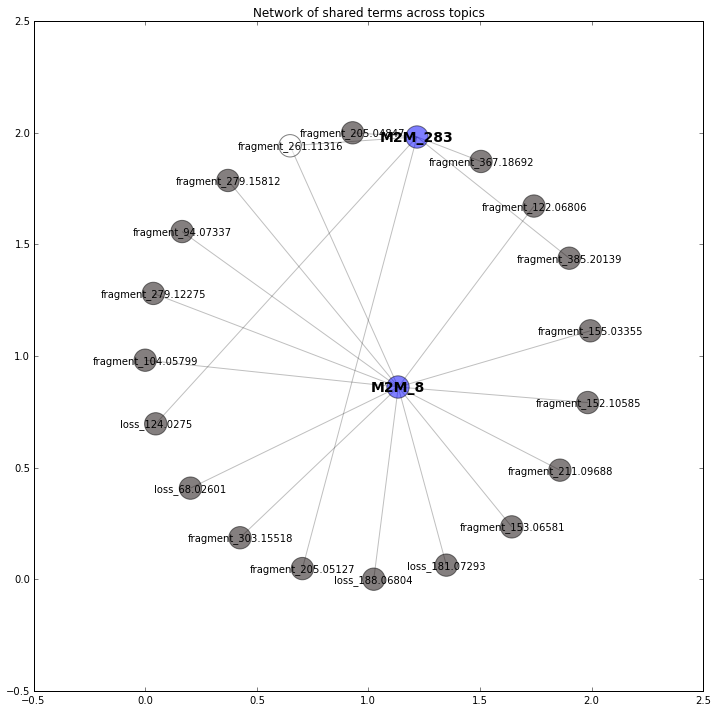

Community 78
Mass2Motif 139: fragment_89.06006, fragment_133.08631, fragment_177.11278, fragment_111.04428, loss_167.11544, fragment_155.07011, fragment_283.17366, fragment_239.14817, 

Mass2Motif 180: fragment_89.05937, fragment_151.09674, fragment_133.08631, fragment_101.09635, loss_103.09952, fragment_55.05466, fragment_207.15882, fragment_224.09232, fragment_145.1228, fragment_168.0384, fragment_136.07599, fragment_83.08555, fragment_224.12511, 



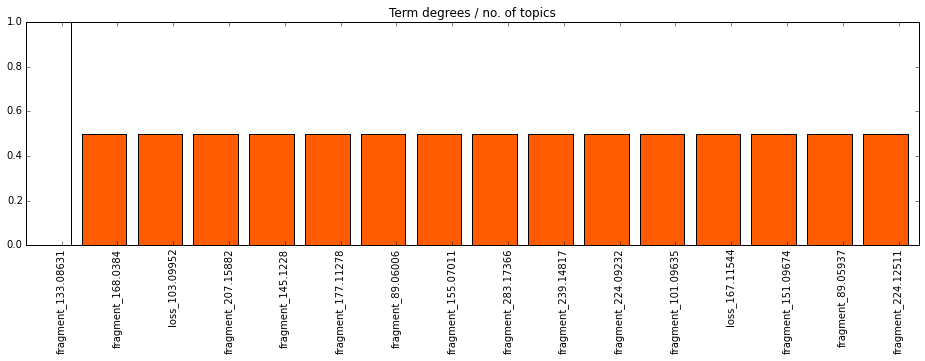

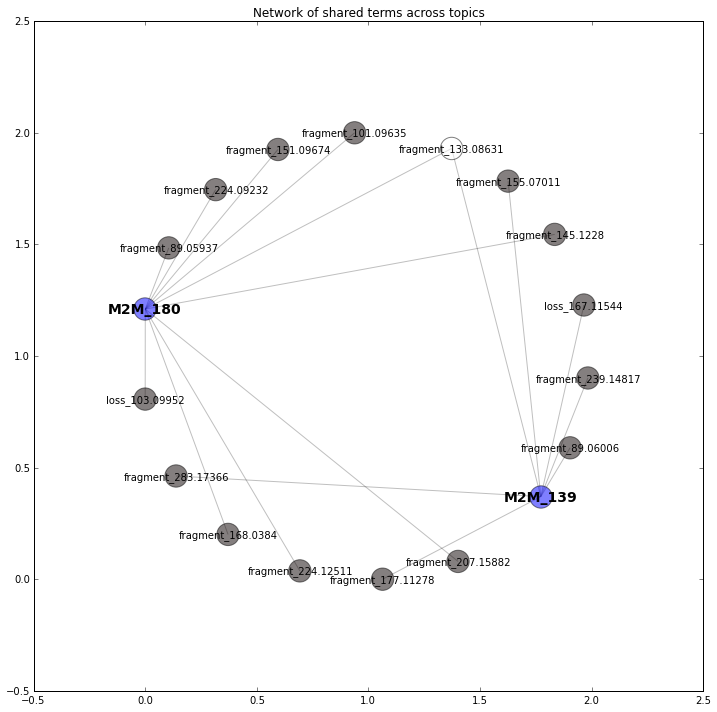

Community 83
Mass2Motif 46: loss_118.06289, loss_159.0648, fragment_143.08199, fragment_184.13379, loss_119.05812, fragment_186.07581, loss_191.07911, loss_178.08394, fragment_287.12316, loss_113.0584, fragment_202.14401, fragment_229.12833, fragment_112.12086, fragment_110.09699, fragment_305.08664, 

Mass2Motif 81: loss_148.07328, fragment_229.14301, fragment_147.11654, loss_82.02672, fragment_332.19256, fragment_113.0602, fragment_70.07342, fragment_226.07799, loss_138.08914, loss_124.07359, loss_176.0683, loss_162.08877, loss_150.08907, fragment_262.15297, loss_64.01501, fragment_165.12822, fragment_314.18594, fragment_209.08095, fragment_276.13049, fragment_282.14056, fragment_224.09897, loss_174.08911, fragment_264.13223, fragment_114.06348, loss_110.05754, 

Mass2Motif 110: loss_124.07359, loss_128.04723, loss_112.07382, fragment_209.10536, loss_82.06337, fragment_110.07176, loss_148.07328, loss_64.05223, loss_140.06808, fragment_82.05232, loss_118.06289, fragment_84.04486, loss

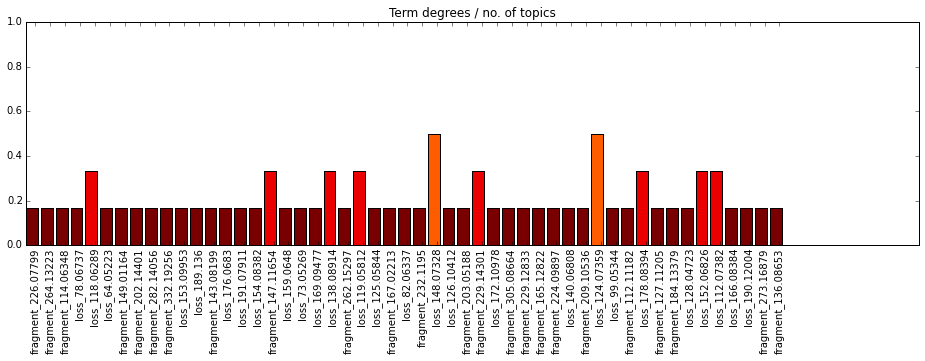

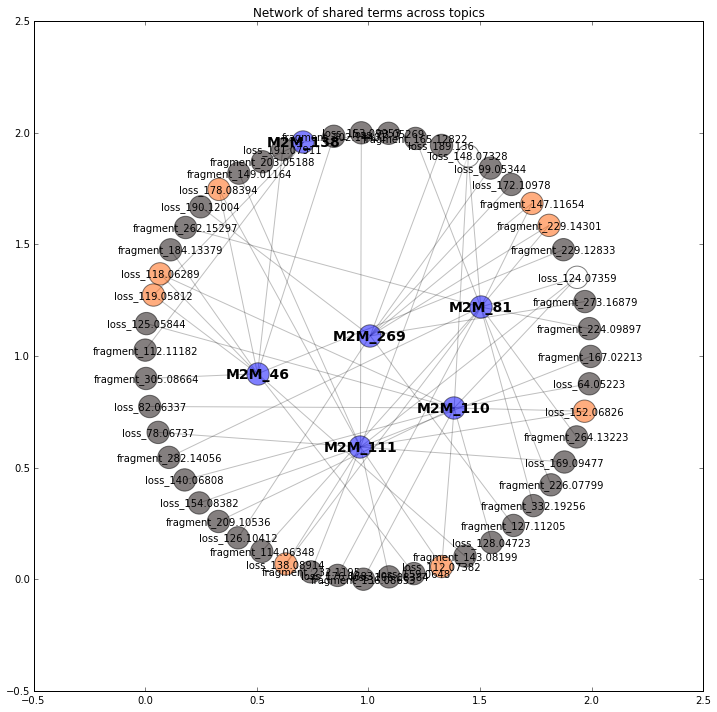

Community 84
Mass2Motif 43: fragment_156.0414, fragment_103.0239, fragment_133.03545, fragment_121.03473, fragment_98.98385, fragment_151.04573, loss_23.01523, loss_57.0579, fragment_74.09665, fragment_130.06322, fragment_100.02407, 

Mass2Motif 243: fragment_98.98385, loss_56.02612, fragment_127.01561, fragment_173.02023, fragment_261.03653, 



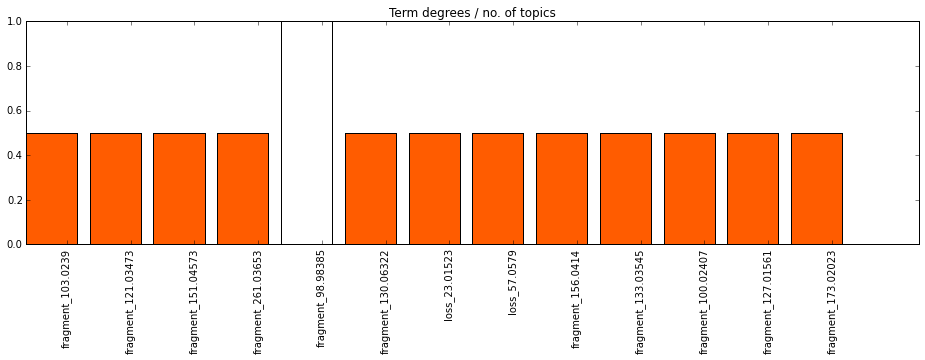

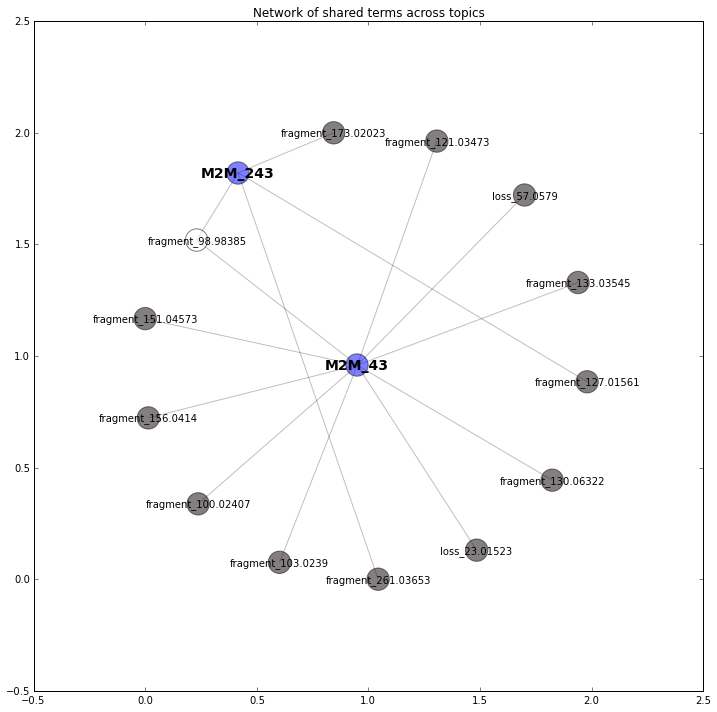

Community 105
Mass2Motif 32: fragment_129.05464, fragment_313.17946, fragment_147.06565, fragment_201.12852, fragment_295.17124, loss_81.0427, loss_141.06393, fragment_173.13233, loss_123.05309, fragment_143.08513, fragment_129.07004, fragment_128.06202, loss_140.04686, loss_130.06265, loss_125.06876, loss_151.04772, loss_182.09381, fragment_131.08505, fragment_159.0805, fragment_115.05435, fragment_210.07675, fragment_131.08638, loss_184.10997, loss_113.06875, fragment_239.09204, fragment_331.18729, fragment_261.14915, fragment_149.13253, loss_136.12431, 

Mass2Motif 84: fragment_57.07013, fragment_345.20866, fragment_327.196, fragment_239.09204, fragment_201.12852, fragment_261.14915, fragment_85.06477, fragment_91.05413, fragment_289.14207, fragment_131.08505, fragment_105.07019, fragment_115.05435, fragment_277.14325, fragment_129.07004, fragment_79.05416, fragment_309.18637, fragment_173.13233, loss_126.06749, loss_102.06801, fragment_275.1278, fragment_271.13352, fragment_143.085

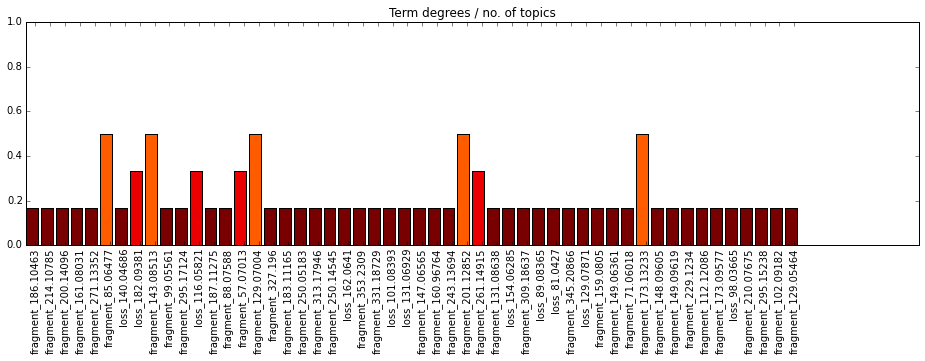

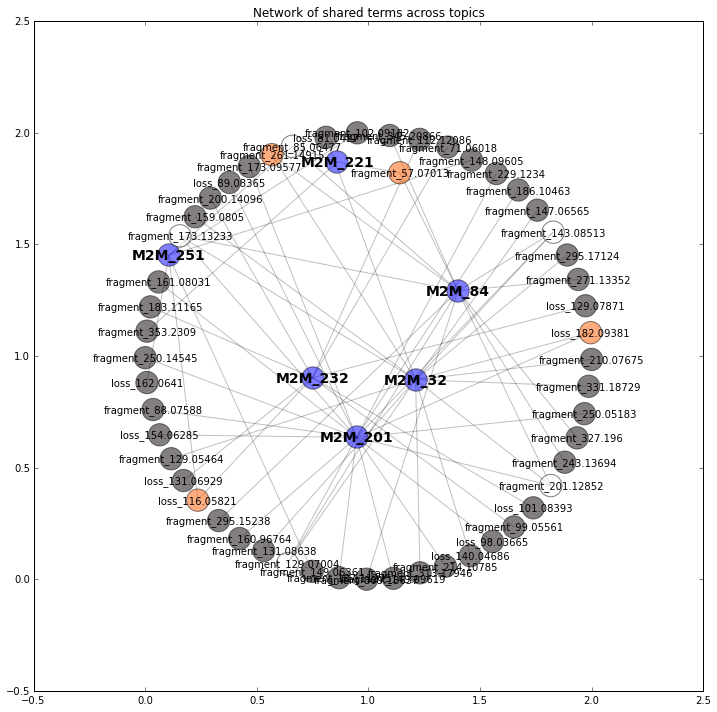

Community 111
Mass2Motif 28: fragment_81.04501, loss_61.05259, loss_62.03678, loss_97.05272, fragment_287.09125, fragment_125.07093, fragment_124.08698, fragment_143.08199, fragment_54.03418, fragment_269.08218, loss_47.03699, fragment_172.02904, fragment_190.03783, loss_115.06303, 

Mass2Motif 45: fragment_84.08071, fragment_56.04977, fragment_130.08587, loss_91.06316, fragment_67.05454, 

Mass2Motif 116: fragment_166.07209, fragment_120.04414, fragment_537.39673, fragment_316.13922, fragment_167.05677, loss_131.05794, fragment_196.09586, fragment_149.04599, fragment_130.08587, fragment_70.02895, 

Mass2Motif 137: fragment_85.08406, fragment_84.08071, loss_104.98712, fragment_127.09451, loss_105.99024, loss_106.02643, loss_106.04574, fragment_58.06552, fragment_144.0659, fragment_154.04951, loss_91.06316, fragment_131.0893, loss_92.0663, loss_63.97936, fragment_69.03368, fragment_102.0547, loss_104.0108, loss_132.00566, fragment_126.09191, fragment_190.10765, loss_60.07694, fragment_1

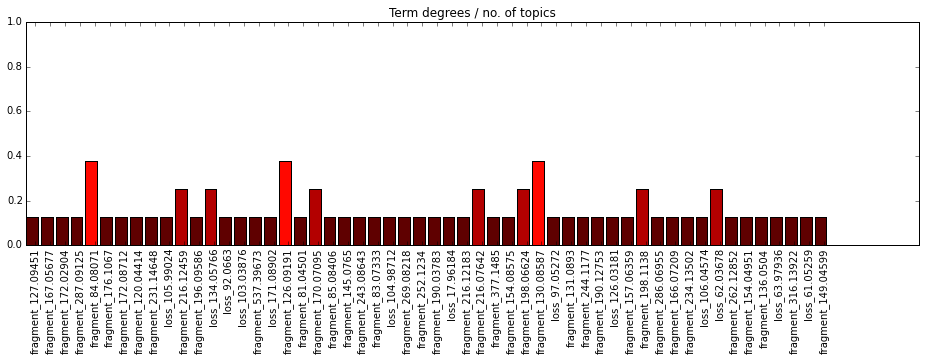

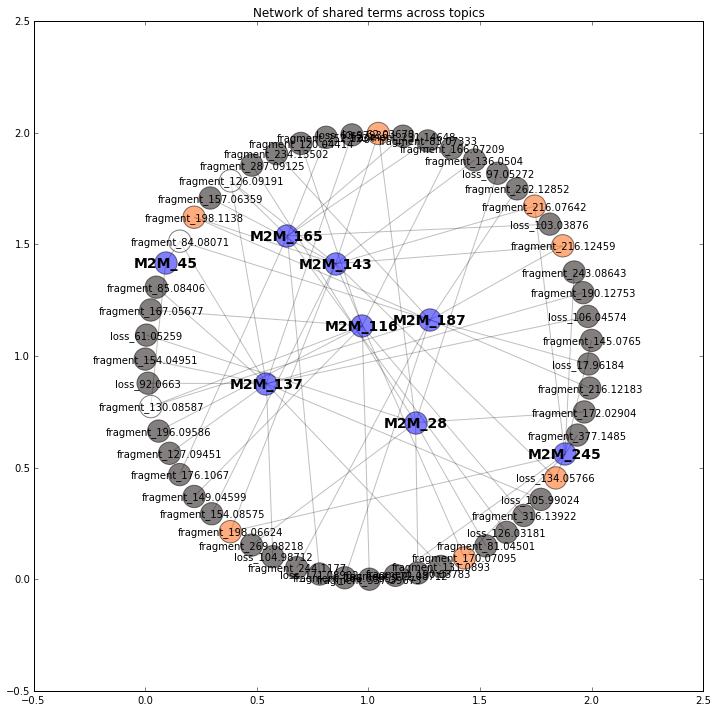

Community 113
Mass2Motif 7: fragment_104.10738, fragment_86.09652, fragment_221.01907, fragment_60.08102, fragment_280.09383, fragment_71.07325, fragment_258.10965, fragment_125.00052, fragment_383.07324, 

Mass2Motif 68: fragment_258.13325, fragment_276.1435, fragment_230.13972, fragment_86.09652, fragment_276.11298, fragment_88.03919, fragment_87.03155, fragment_132.10154, fragment_97.02839, fragment_112.03981, fragment_69.03368, fragment_212.12758, fragment_58.02903, fragment_98.09683, fragment_69.07013, fragment_85.02832, fragment_248.15, loss_188.10499, fragment_144.10184, loss_179.11525, loss_64.01501, 

Mass2Motif 141: fragment_190.14491, fragment_130.0492, fragment_258.10965, loss_106.09976, fragment_85.06477, fragment_239.07487, fragment_192.06433, fragment_134.06003, fragment_336.1197, loss_130.06265, fragment_241.08168, fragment_131.05381, loss_105.07881, fragment_219.07777, fragment_68.04977, fragment_437.16635, fragment_348.12239, fragment_98.03152, fragment_164.07055, los

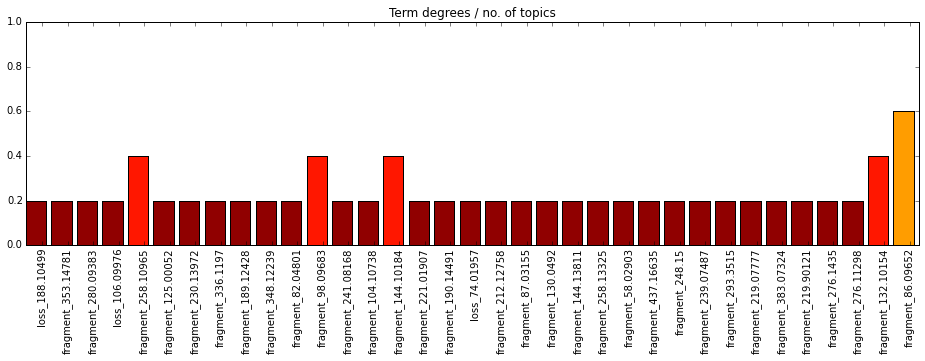

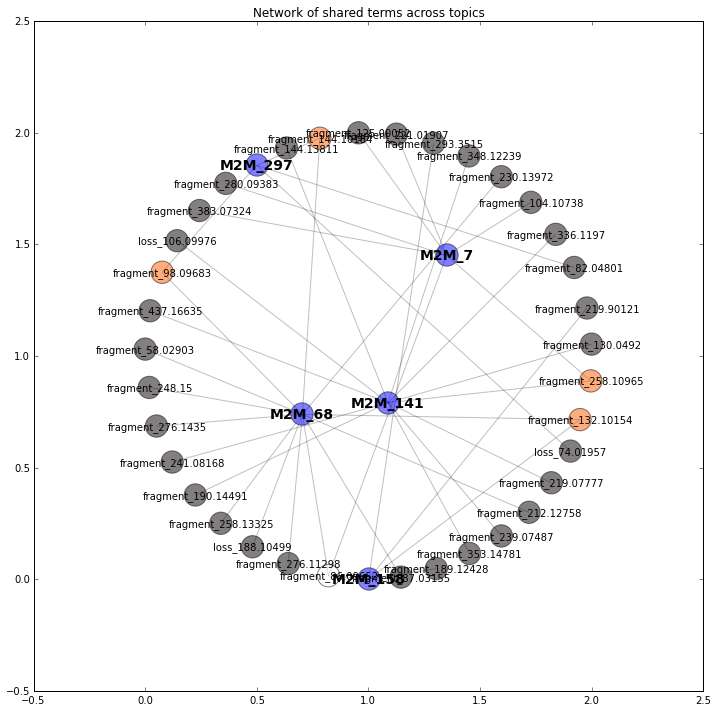

Community 117
Mass2Motif 10: loss_157.03725, loss_111.03185, loss_174.06386, loss_128.05814, fragment_167.08152, loss_193.07267, fragment_213.08628, loss_198.06389, loss_171.05283, 

Mass2Motif 29: fragment_325.08989, fragment_292.10196, fragment_274.0918, fragment_148.06033, loss_84.0415, fragment_226.07153, fragment_68.04977, 

Mass2Motif 100: loss_179.04293, fragment_206.07152, fragment_215.1037, fragment_167.08152, loss_84.0415, fragment_146.98128, fragment_251.15813, loss_143.07942, fragment_108.04425, fragment_198.1138, fragment_216.12183, loss_167.04264, loss_181.05877, fragment_206.05469, loss_35.9844, fragment_206.10066, fragment_97.02839, loss_167.07941, loss_179.07913, fragment_215.13959, fragment_72.04466, fragment_110.05978, 

Mass2Motif 225: loss_84.0415, fragment_341.15015, fragment_229.12009, fragment_309.18111, fragment_389.16928, fragment_139.08646, loss_54.03129, fragment_216.08791, fragment_81.03334, fragment_263.13811, fragment_300.10938, 



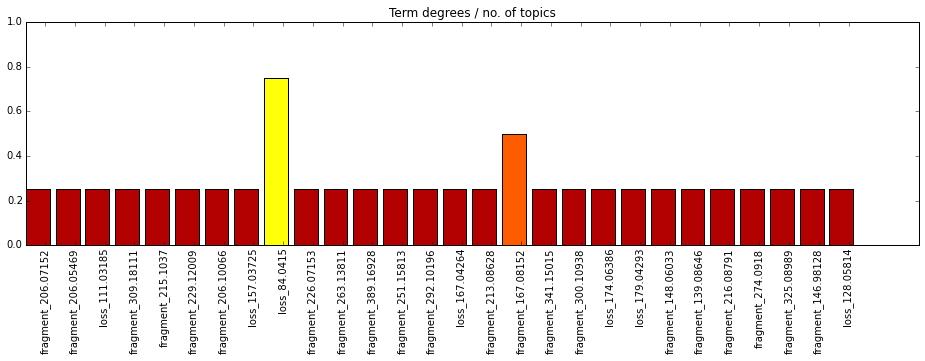

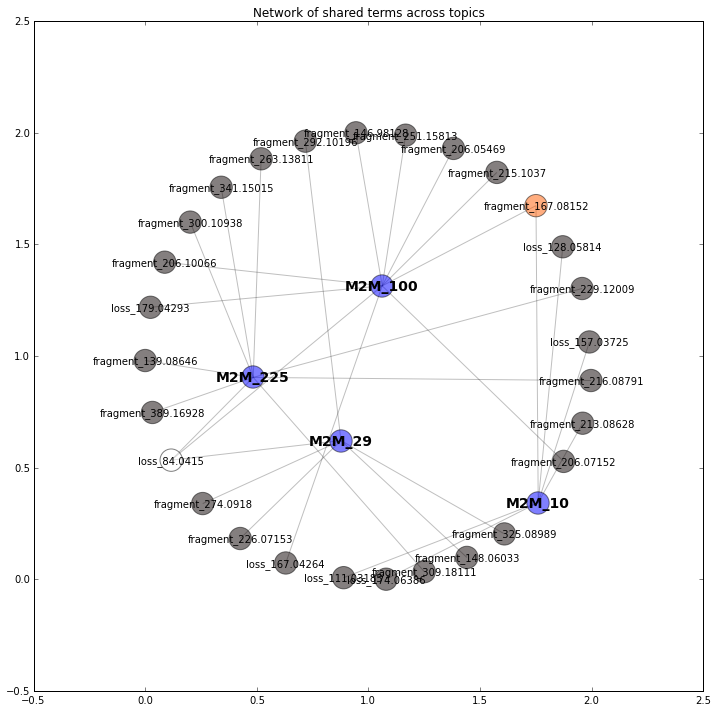

Community 122
Mass2Motif 57: fragment_148.04667, fragment_312.14144, fragment_330.15717, fragment_120.05292, loss_174.11207, fragment_294.16232, fragment_92.05779, fragment_167.07126, loss_163.08432, fragment_330.11734, fragment_276.15329, fragment_276.12189, 

Mass2Motif 92: loss_17.99887, fragment_314.18594, fragment_148.04853, fragment_278.16949, fragment_92.05779, fragment_296.17379, fragment_332.19256, fragment_120.05292, loss_130.06265, fragment_202.13056, fragment_131.08505, loss_164.06819, 

Mass2Motif 183: fragment_238.12006, loss_17.99887, loss_186.06392, loss_188.07979, loss_128.03157, fragment_68.04977, loss_172.08459, fragment_256.11603, loss_80.01013, loss_142.07387, loss_90.04283, loss_114.07908, loss_158.06888, fragment_166.08631, fragment_142.05024, fragment_164.08271, loss_161.06841, loss_92.04711, fragment_123.06823, fragment_238.07132, fragment_95.06076, fragment_126.05438, loss_130.0741, loss_160.08466, 

Mass2Motif 298: loss_58.98944, loss_174.11207, fragment_187.

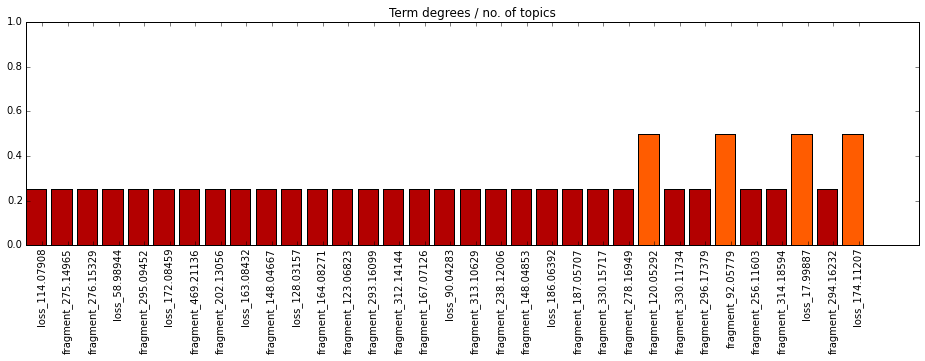

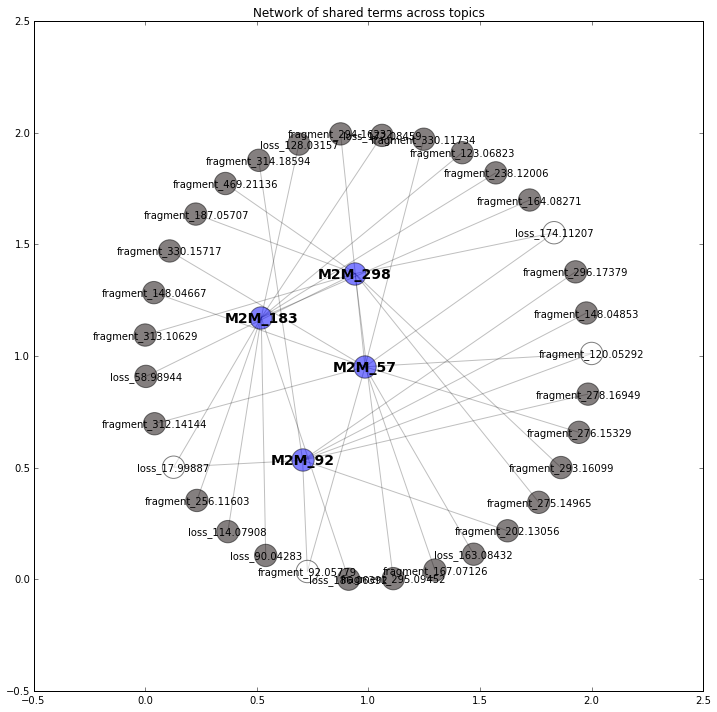

Community 134
Mass2Motif 3: fragment_160.10738, fragment_116.04752, fragment_160.09585, loss_144.07831, loss_43.98915, fragment_114.09123, fragment_71.06057, loss_189.0998, fragment_280.15588, loss_98.07258, loss_115.09993, loss_46.01667, fragment_96.08074, fragment_55.02948, loss_90.04283, fragment_100.07536, loss_161.10507, fragment_262.14426, loss_157.11028, loss_105.07881, 

Mass2Motif 76: loss_90.03155, fragment_128.95319, fragment_200.12831, fragment_160.09781, fragment_114.09123, fragment_62.98202, fragment_96.08074, fragment_218.13979, loss_91.0268, loss_102.03159, 

Mass2Motif 166: fragment_126.0665, fragment_109.03967, loss_103.06338, fragment_127.03204, loss_43.98915, fragment_83.06041, fragment_186.10718, loss_130.0741, fragment_69.05759, fragment_68.04977, fragment_108.05597, fragment_81.04501, 

Mass2Motif 211: loss_59.037, fragment_114.09123, loss_101.04757, loss_59.00065, fragment_131.11777, fragment_425.1355, fragment_72.04466, fragment_60.04477, 

Mass2Motif 255: loss

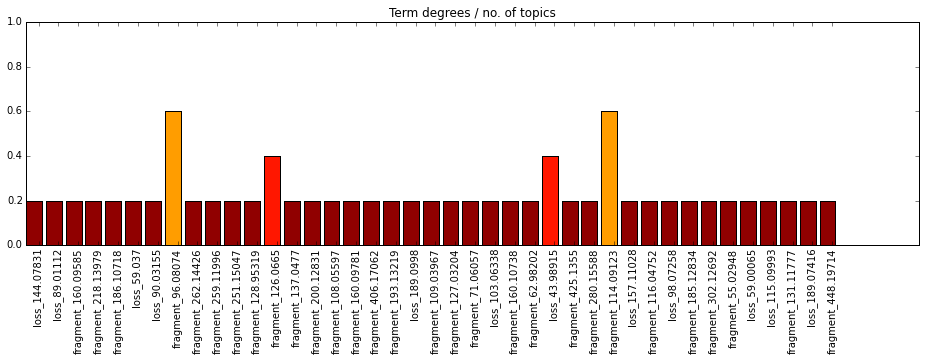

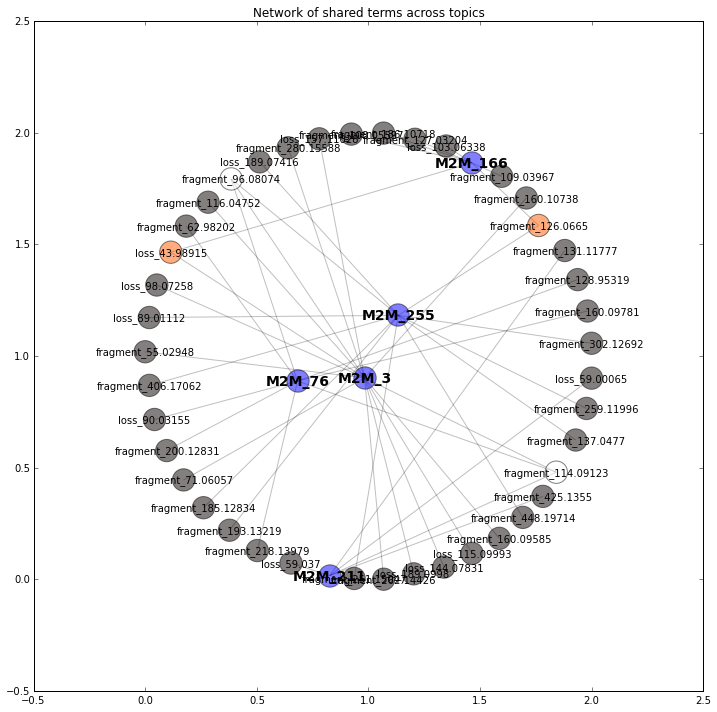

Community 139
Nothing interesting

Community 140
Mass2Motif 77: fragment_114.0554, fragment_68.04977, fragment_55.01824, loss_179.02518, loss_46.03002, 

Mass2Motif 133: fragment_174.10229, fragment_246.08693, fragment_95.06076, fragment_80.04949, loss_184.04762, loss_62.00034, fragment_202.09766, loss_132.02912, fragment_132.06848, loss_183.05214, fragment_81.04501, fragment_130.06595, fragment_200.08282, loss_117.00575, loss_64.01501, loss_196.04755, fragment_68.04977, fragment_147.09209, loss_106.02643, loss_133.03732, fragment_131.06093, fragment_158.0708, fragment_53.03888, loss_157.03725, fragment_159.07862, fragment_107.06037, 

Mass2Motif 136: fragment_95.06076, fragment_68.04977, fragment_141.06607, fragment_113.07058, fragment_163.07638, fragment_154.1346, fragment_113.03405, loss_59.01322, fragment_82.05232, fragment_70.02895, fragment_121.02828, fragment_96.00841, 

Mass2Motif 167: fragment_156.01204, fragment_128.07037, fragment_114.0554, fragment_174.02178, fragment_156.0

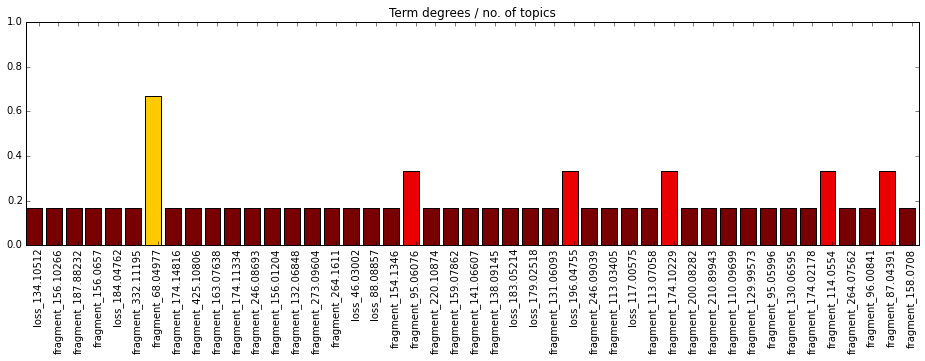

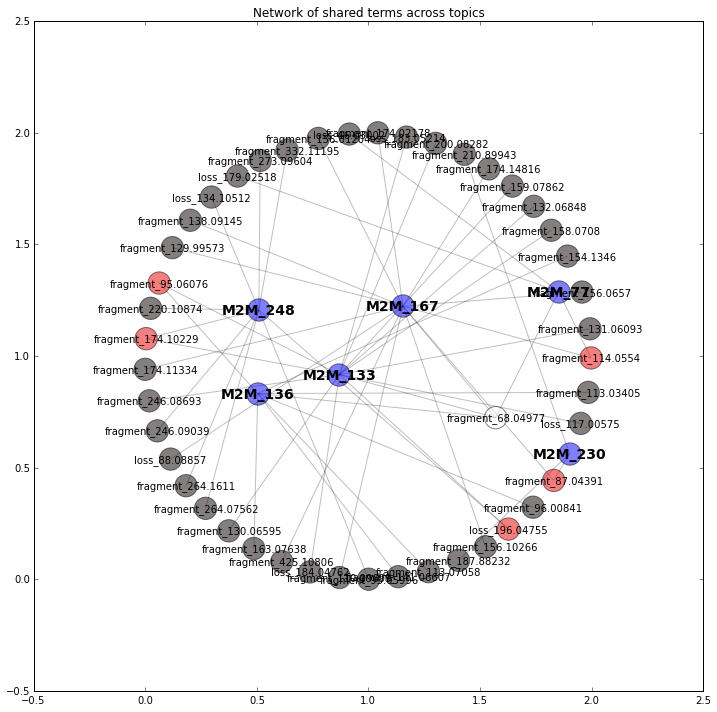

Community 142
Nothing interesting

Community 181
Mass2Motif 59: fragment_84.04486, loss_162.03528, fragment_56.04977, loss_185.08026, 

Mass2Motif 182: loss_146.05771, fragment_137.04626, fragment_239.1376, fragment_193.13416, fragment_56.04977, fragment_221.12807, loss_183.08923, fragment_119.03518, fragment_110.03458, loss_27.01101, loss_129.07871, 

Mass2Motif 220: fragment_136.06239, loss_162.03528, fragment_119.03518, loss_153.04184, fragment_137.04626, 



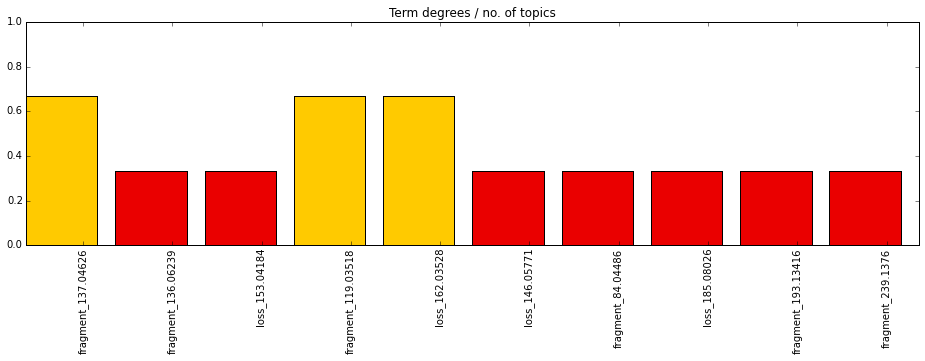

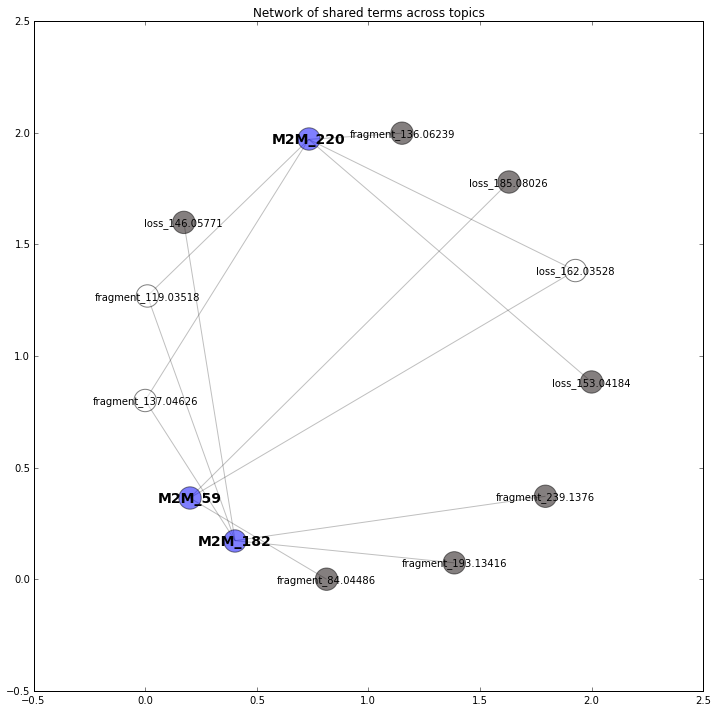

Community 194
Nothing interesting

Community 197
Nothing interesting

Community 230
Mass2Motif 124: loss_193.09468, loss_133.03732, fragment_296.14969, fragment_314.16006, fragment_296.09674, fragment_236.99129, loss_138.06832, fragment_176.09136, fragment_278.0862, fragment_296.06772, 

Mass2Motif 194: fragment_62.92941, fragment_121.96571, fragment_135.06377, fragment_153.07482, fragment_246.18182, loss_146.10511, fragment_145.1049, loss_188.11568, loss_129.07871, fragment_117.10291, fragment_139.03976, loss_60.07694, 

Mass2Motif 205: loss_77.04757, fragment_189.88155, fragment_159.06528, fragment_212.89765, fragment_236.12196, fragment_190.1226, fragment_62.92941, fragment_119.07334, loss_117.0545, fragment_64.92754, loss_116.03208, loss_23.01523, loss_118.06289, fragment_236.12829, fragment_118.06544, fragment_57.0337, 

Mass2Motif 299: loss_105.04255, loss_188.11568, loss_133.03732, fragment_243.16962, fragment_260.19458, 



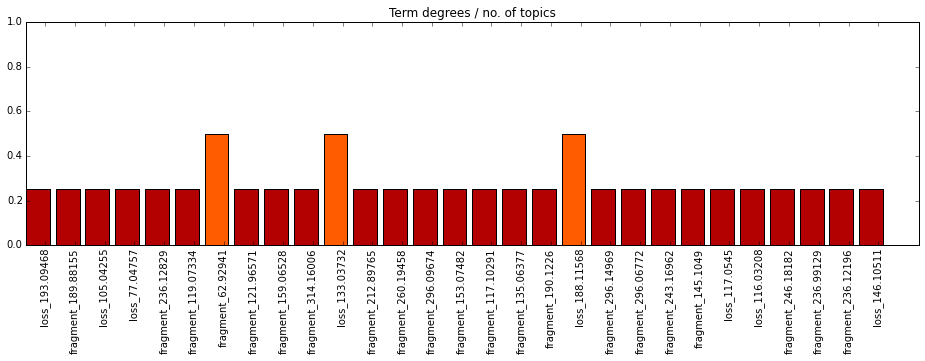

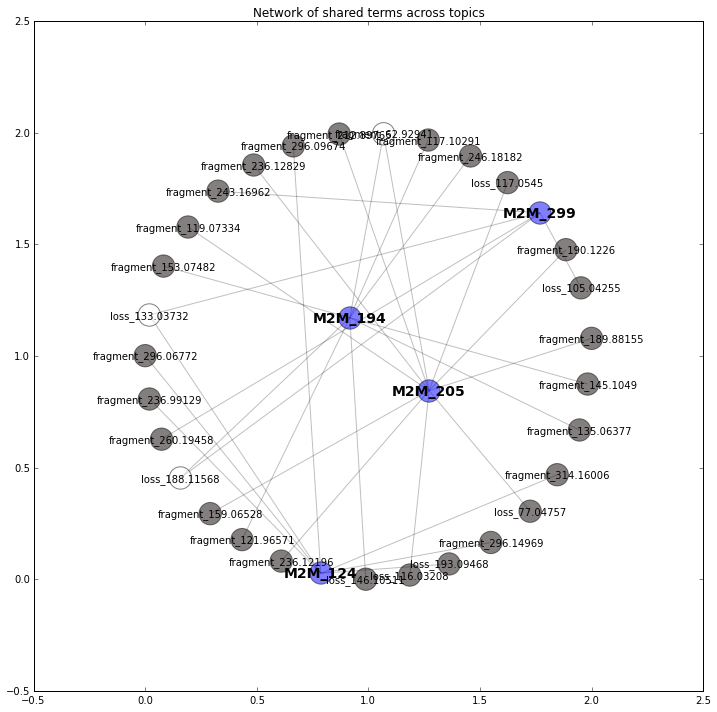

Community 243
Mass2Motif 31: fragment_112.07584, fragment_175.05821, fragment_287.05496, loss_104.9927, loss_92.04711, fragment_158.08046, fragment_130.08587, fragment_115.05902, fragment_176.09136, loss_59.01946, 

Mass2Motif 207: fragment_152.07028, fragment_134.06003, fragment_211.10854, fragment_109.05264, fragment_106.06503, fragment_79.05416, fragment_80.04949, fragment_193.09868, loss_61.02852, fragment_151.04713, fragment_170.0813, 

Mass2Motif 242: fragment_106.06503, fragment_180.06461, fragment_134.06003, loss_45.02195, fragment_79.05416, loss_119.02144, loss_104.9927, fragment_175.00156, fragment_303.12503, loss_91.0268, fragment_147.06411, fragment_180.13744, fragment_119.06843, fragment_107.0708, fragment_53.03888, loss_141.0423, 



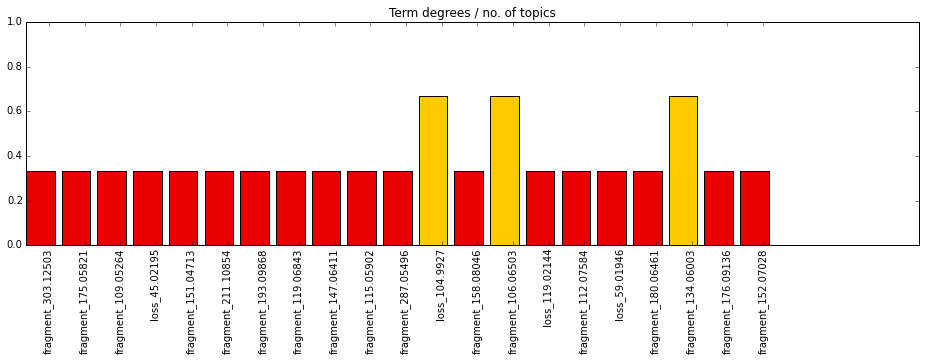

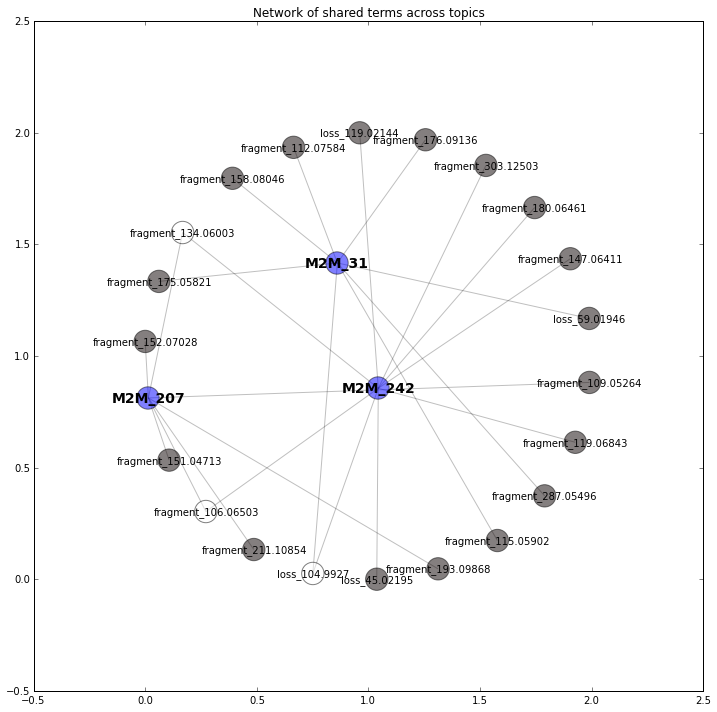

Community 314
Mass2Motif 33: fragment_111.11663, loss_193.13119, fragment_55.05466, loss_176.10425, fragment_304.09863, fragment_199.16873, 

Mass2Motif 51: fragment_110.05978, loss_162.09967, fragment_166.04988, fragment_65.03878, fragment_134.03211, fragment_92.04949, loss_187.1305, loss_193.99432, fragment_231.08324, loss_187.08397, fragment_73.06466, fragment_266.07259, loss_175.13107, fragment_272.12268, 

Mass2Motif 195: fragment_72.0807, fragment_55.05466, 

Mass2Motif 227: fragment_83.04894, fragment_55.05466, fragment_111.04428, fragment_65.03878, fragment_55.01824, 

Mass2Motif 257: fragment_149.0237, fragment_65.03878, fragment_121.02828, loss_130.13543, loss_68.0625, fragment_149.13253, fragment_155.03355, loss_124.12531, fragment_211.09688, fragment_307.16486, fragment_355.18262, 

Mass2Motif 291: fragment_55.05466, fragment_73.06466, loss_168.09943, loss_184.09455, fragment_57.05774, loss_156.10035, loss_108.07836, fragment_109.02775, 



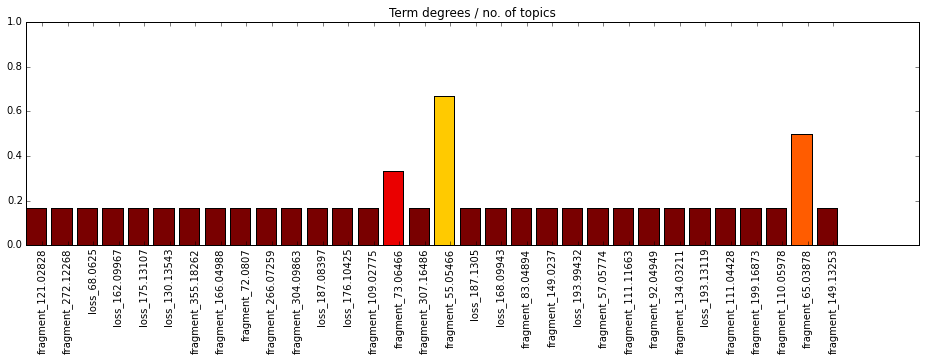

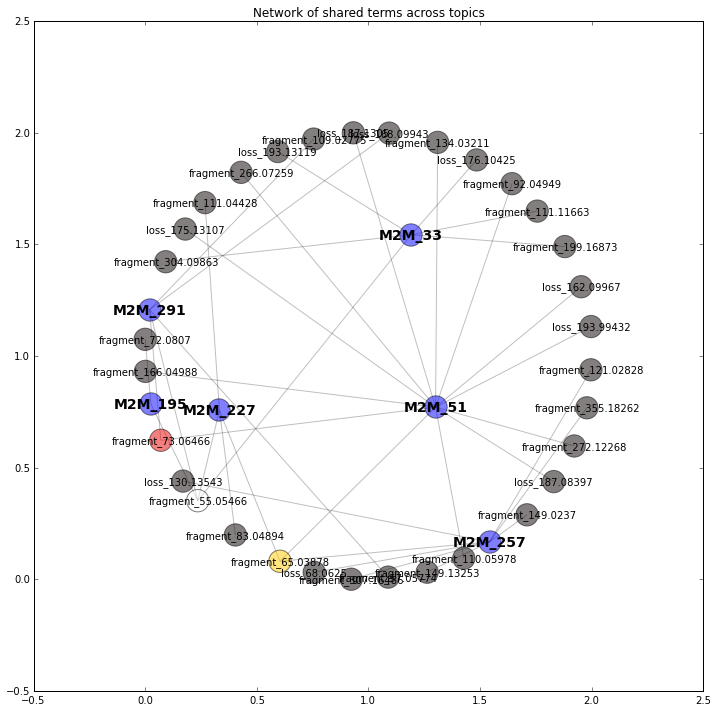

Community 380
Nothing interesting

Community 583
Nothing interesting

Community 732
Nothing interesting

Community 978
Nothing interesting

Community 1184
Nothing interesting

Community 1219
Nothing interesting

Community 1491
Nothing interesting

Community 1841
Nothing interesting

Community 2065
Nothing interesting



In [24]:
plot_community(G, partition, node_names, show_label=True)